## Problem Statement

### Context

In recent times, the field of agriculture has been in urgent need of modernizing, since the amount of manual work people need to put in to check if plants are growing correctly is still highly extensive. Despite several advances in agricultural technology, people working in the agricultural industry still need to have the ability to sort and recognize different plants and weeds, which takes a lot of time and effort in the long term. The potential is ripe for this trillion-dollar industry to be greatly impacted by technological innovations that cut down on the requirement for manual labor, and this is where Artificial Intelligence can actually benefit the workers in this field, as **the time and energy required to identify plant seedlings will be greatly shortened by the use of AI and Deep Learning.** The ability to do so far more efficiently and even more effectively than experienced manual labor, could lead to better crop yields, the freeing up of human inolvement for higher-order agricultural decision making, and in the long term will result in more sustainable environmental practices in agriculture as well.


### Objective

The aim of this project is to Build a Convolutional Neural Network to classify plant seedlings into their respective categories.

In [ ]:
!pip install tensorflow==2.15.0 scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 opencv-python==4.8.0.76 -q --user

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.3/475.3 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 40.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.8/294.8 kB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 74.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 31.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 37.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 MB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 54.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 45.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 75.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 28.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 6.3 MB/s eta 0:00:00
  Consider adding this directory to PATH or, if you prefe

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import time

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix

import tensorflow as tf

from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model
from keras.applications.vgg16 import VGG16

from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization, Activation, LeakyReLU, Conv2D, MaxPooling2D
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.regularizers import l1, l2, l1_l2

## Loading the dataset

In [ ]:
images = np.load('images.npy')
labels = pd.read_csv('Labels.csv')

## Data Overview

### Understand the shape of the dataset

In [ ]:
print(f"Images shape: {images.shape}")
print(f"Labels shape: {labels.shape}")

Images shape: (4750, 128, 128, 3)
Labels shape: (4750, 1)


- The images shape is (# of samples/images, width, height, channels)
  - So, there are 4,750 samples/images
  - Each image has a width of 128 and a height of 128
  - Each image has 3 channels
- The lables has 4,750 samples/images and it indicates the class of each image

In [ ]:
labels

,Label
0,Small-flowered Cranesbill
1,Small-flowered Cranesbill
2,Small-flowered Cranesbill
3,Small-flowered Cranesbill
4,Small-flowered Cranesbill
...,...
4745,Loose Silky-bent
4746,Loose Silky-bent
4747,Loose Silky-bent
4748,Loose Silky-bent


## Exploratory Data Analysis

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you understand the data better.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

1. How are these different category plant images different from each other?
2. Is the dataset provided an imbalance? (Check with using bar plots)

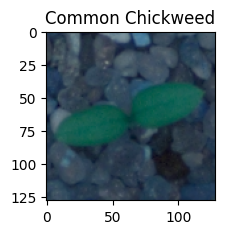

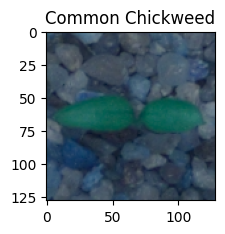

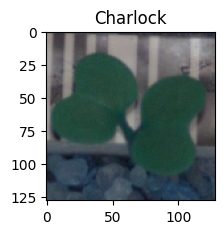

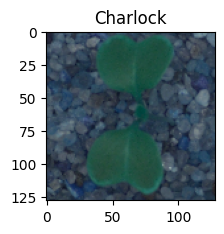

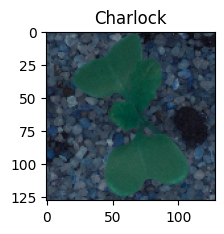

...

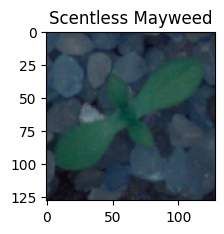

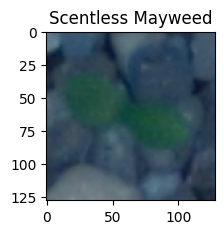

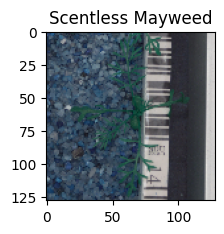

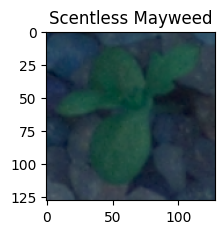

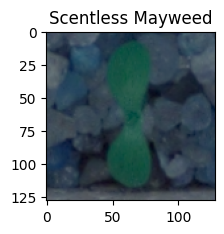

In [ ]:
for i in range(2000,3000,20):
    plt.figure(figsize=(10, 10))
    plt.subplot(3, 4, 1)
    plt.imshow(images[i])
    plt.title(labels['Label'][i])
    plt.show()

- These are the different plant images

**2. Is the dataset provided an imbalance? (Check with using bar plots)**

<Axes: xlabel='Label', ylabel='count'>

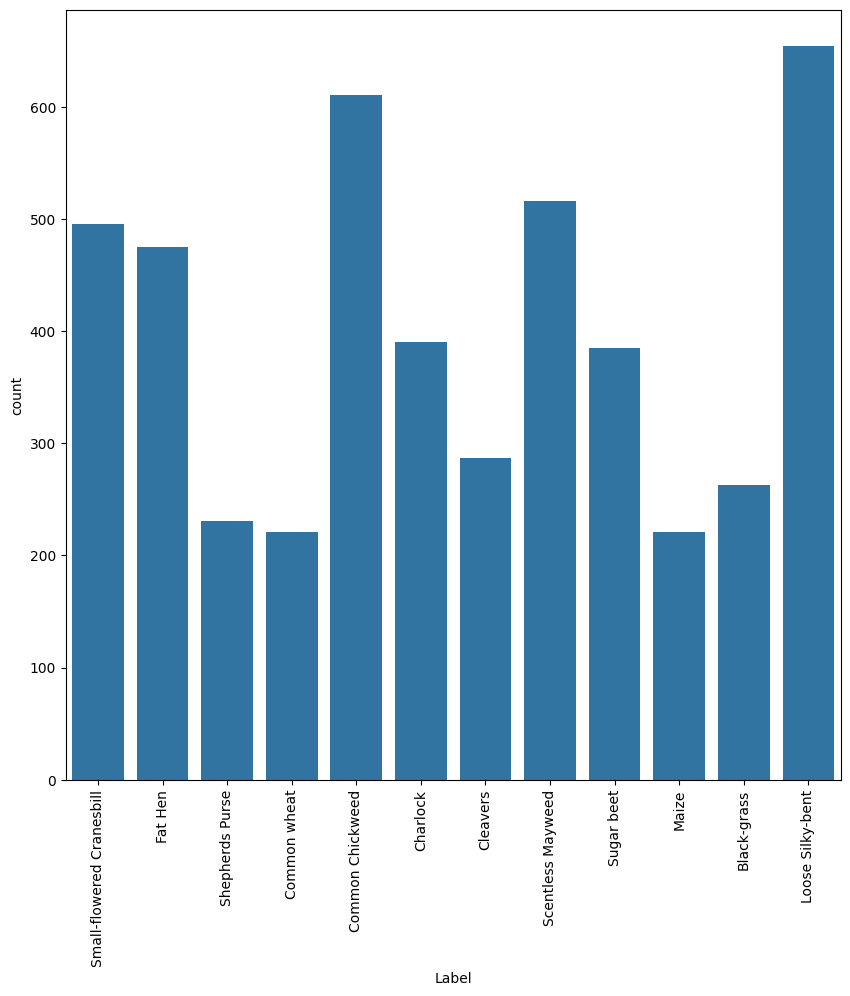

In [ ]:
plt.figure(figsize=(10, 10))
plt.xticks(rotation=90)
sns.countplot(x='Label', data=labels)

- Yes, there is imbalance in the dataset.
- 'Loose Silky-bent' has the most images followed by 'Common Chickweed'
- There is a huge difference on the count of the different types of seeds

## Data Pre-Processing

### Convert the BGR images to RGB images.

In [ ]:
def convert_bgr_to_rgb(images):
  rgb_images = []
  for img in images:
    rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    rgb_images.append(rgb_img)
  return np.array(rgb_images)

rgb_images = convert_bgr_to_rgb(images)

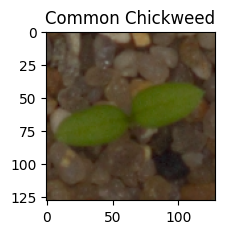

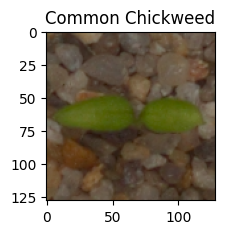

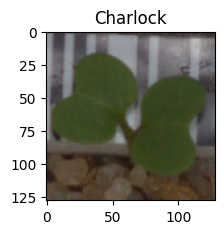

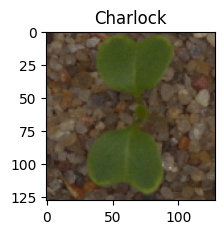

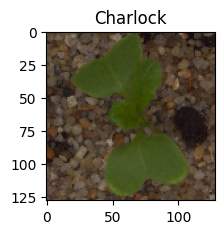

...

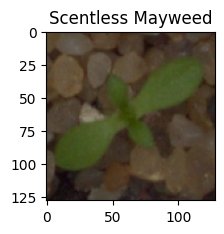

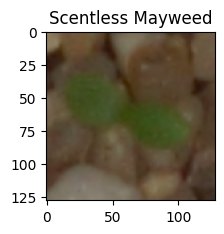

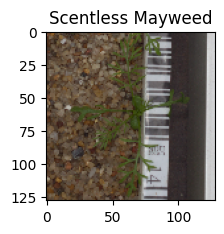

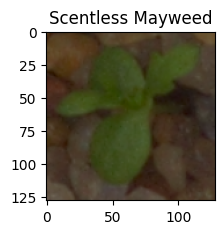

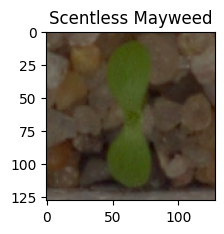

In [ ]:
for i in range(2000,3000,20):
    plt.figure(figsize=(10, 10))
    plt.subplot(3, 4, 1)
    plt.imshow(rgb_images[i])
    plt.title(labels['Label'][i])
    plt.show()

### Resize the images

As the size of the images is large, it may be computationally expensive to train on these larger images; therefore, it is preferable to reduce the image size from 128 to 64.

In [ ]:
def resize_images(rgb_images, new_width, new_height):
  resized_images = []
  for img in rgb_images:
    resized_img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_AREA)
    #resized_img = resized_img.astype(np.float32)
    #normalize_img = resized_img / 255.0
    resized_images.append(resized_img)
  return np.array(resized_images)

resized_images = resize_images(rgb_images, 64, 64)

In [ ]:
resized_images

array([[[[ 74,  49,  35],
         [ 83,  65,  49],
         [ 99,  82,  67],
         ...,
         [106,  91,  75],
         [112,  95,  79],
         [108,  93,  78]],

        [[ 72,  52,  34],
         [104,  88,  72],
         [114,  97,  80],
         ...,
         [102,  86,  72],
         [108,  93,  79],
         [108,  95,  80]],

        [[ 77,  56,  38],
         [100,  83,  67],
         [113,  95,  78],
         ...,
         [ 98,  83,  69],
         [105,  90,  76],
         [106,  92,  80]],

        ...,

        [[ 66,  43,  31],
         [ 67,  49,  33],
         [ 68,  50,  38],
         ...,
         [ 88,  67,  54],
         [ 96,  79,  62],
         [ 95,  76,  65]],

        [[ 71,  51,  37],
         [ 74,  58,  44],
         [ 73,  56,  46],
         ...,
         [ 81,  59,  45],
         [ 90,  73,  58],
         [ 97,  80,  67]],

        [[ 72,  58,  43],
         [ 73,  57,  41],
         [ 72,  56,  41],
         ...,
         [ 71,  45,  29],
        

### Data Preparation for Modeling

- Before you proceed to build a model, you need to split the data into train, test, and validation to be able to evaluate the model that you build on the train data
- You'll have to encode categorical features and scale the pixel values.
- You will build a model using the train data and then check its performance

**Split the dataset**

In [ ]:
X_temp, X_test, y_temp, y_test = train_test_split(
    resized_images,
    labels,
    test_size=0.2,
    random_state=42,
    stratify=labels
)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_temp,
    y_temp,
    test_size=0.25,
    random_state=42,
    stratify=y_temp
)

In [ ]:
print(f"X_train shape: {X_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"X_test shape: {X_test.shape}")

X_train shape: (2850, 64, 64, 3)
X_val shape: (950, 64, 64, 3)
X_test shape: (950, 64, 64, 3)


In [ ]:
X_train

array([[[[114,  89,  57],
         [118,  92,  57],
         [108,  80,  42],
         ...,
         [ 66,  49,  39],
         [ 83,  69,  57],
         [ 88,  72,  61]],

        [[109,  84,  54],
         [124, 101,  61],
         [107,  81,  46],
         ...,
         [ 64,  47,  38],
         [ 78,  63,  50],
         [ 91,  77,  64]],

        [[103,  81,  57],
         [109,  83,  47],
         [110,  80,  43],
         ...,
         [ 78,  61,  52],
         [ 82,  66,  54],
         [ 94,  77,  64]],

        ...,

        [[ 46,  37,  37],
         [ 47,  39,  41],
         [ 46,  39,  39],
         ...,
         [ 75,  66,  61],
         [ 76,  67,  61],
         [ 75,  64,  57]],

        [[ 86,  79,  73],
         [ 89,  84,  79],
         [ 88,  82,  77],
         ...,
         [ 93,  85,  79],
         [ 91,  82,  76],
         [ 91,  82,  76]],

        [[111, 106, 104],
         [ 91,  87,  84],
         [102, 100,  99],
         ...,
         [119, 119, 117],
        

In [ ]:
X_val

array([[[[103,  93,  80],
         [ 99,  94,  76],
         [ 93,  87,  69],
         ...,
         [ 65,  56,  37],
         [ 65,  54,  37],
         [ 65,  51,  39]],

        [[101,  92,  78],
         [ 97,  92,  76],
         [ 85,  77,  62],
         ...,
         [ 69,  58,  42],
         [ 68,  58,  42],
         [ 68,  57,  44]],

        [[ 93,  83,  68],
         [ 98,  91,  77],
         [ 73,  60,  49],
         ...,
         [ 72,  63,  45],
         [ 70,  60,  43],
         [ 68,  57,  41]],

        ...,

        [[ 78,  61,  37],
         [ 81,  68,  41],
         [ 81,  71,  41],
         ...,
         [ 33,  20,  18],
         [ 29,  16,  16],
         [ 28,  18,  14]],

        [[ 78,  68,  42],
         [ 78,  71,  37],
         [ 78,  75,  34],
         ...,
         [ 38,  27,  23],
         [ 37,  26,  25],
         [ 38,  29,  26]],

        [[ 69,  69,  35],
         [ 74,  79,  34],
         [ 74,  83,  33],
         ...,
         [ 41,  29,  25],
        

In [ ]:
X_test

array([[[[162, 158, 147],
         [158, 153, 142],
         [153, 151, 138],
         ...,
         [ 46,  29,  20],
         [ 72,  53,  33],
         [104,  88,  65]],

        [[158, 152, 140],
         [157, 151, 138],
         [157, 153, 142],
         ...,
         [ 52,  33,  21],
         [ 66,  48,  28],
         [101,  85,  62]],

        [[158, 151, 139],
         [159, 152, 140],
         [158, 152, 142],
         ...,
         [ 88,  70,  56],
         [ 92,  75,  60],
         [ 99,  82,  64]],

        ...,

        [[100,  86,  70],
         [103,  87,  70],
         [108,  90,  72],
         ...,
         [ 84,  63,  41],
         [ 88,  67,  44],
         [ 86,  65,  41]],

        [[100,  86,  70],
         [100,  82,  67],
         [106,  87,  71],
         ...,
         [ 90,  69,  47],
         [ 91,  70,  48],
         [ 89,  69,  45]],

        [[103,  87,  71],
         [102,  82,  67],
         [109,  86,  71],
         ...,
         [ 88,  69,  47],
        

### Encode the target labels

In [ ]:
label_encoder = LabelEncoder()

label_encoder.fit(y_train)

y_train = label_encoder.transform(y_train)
y_val = label_encoder.transform(y_val)
y_test = label_encoder.transform(y_test)

y_train_encoded = tf.keras.utils.to_categorical(y_train, num_classes=12)
y_val_encoded = tf.keras.utils.to_categorical(y_val, num_classes=12)
y_test_encoded = tf.keras.utils.to_categorical(y_test, num_classes=12)

/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_label.py:93: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_label.py:129: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_label.py:129: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_label.py:129: DataConversionWarning: A column-vector y was passed when a 1d array was 

In [ ]:
print(f"y_train shape: {y_train.shape}")
print(f"y_val shape: {y_val.shape}")
print(f"y_test shape: {y_test.shape}")

y_train shape: (2850,)
y_val shape: (950,)
y_test shape: (950,)


In [ ]:
y_train_encoded

array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 1., 0., ..., 0., 0., 0.]])

In [ ]:
y_val_encoded

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]])

In [ ]:
y_test_encoded

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

### Data Normalization

In [ ]:
def normalize_img(images):
  normalized_images = []
  for img in images:
    normalized_img = img / 255
    normalized_images.append(normalized_img)
  return np.array(normalized_images)

X_train_normalized = normalize_img(X_train)
X_val_normalized = normalize_img(X_val)
X_test_normalized = normalize_img(X_test)

In [ ]:
X_train_normalized

array([[[[0.44705882, 0.34901961, 0.22352941],
         [0.4627451 , 0.36078431, 0.22352941],
         [0.42352941, 0.31372549, 0.16470588],
         ...,
         [0.25882353, 0.19215686, 0.15294118],
         [0.3254902 , 0.27058824, 0.22352941],
         [0.34509804, 0.28235294, 0.23921569]],

        [[0.42745098, 0.32941176, 0.21176471],
         [0.48627451, 0.39607843, 0.23921569],
         [0.41960784, 0.31764706, 0.18039216],
         ...,
         [0.25098039, 0.18431373, 0.14901961],
         [0.30588235, 0.24705882, 0.19607843],
         [0.35686275, 0.30196078, 0.25098039]],

        [[0.40392157, 0.31764706, 0.22352941],
         [0.42745098, 0.3254902 , 0.18431373],
         [0.43137255, 0.31372549, 0.16862745],
         ...,
         [0.30588235, 0.23921569, 0.20392157],
         [0.32156863, 0.25882353, 0.21176471],
         [0.36862745, 0.30196078, 0.25098039]],

        ...,

        [[0.18039216, 0.14509804, 0.14509804],
         [0.18431373, 0.15294118, 0.16078431]

In [ ]:
X_val_normalized

array([[[[0.40392157, 0.36470588, 0.31372549],
         [0.38823529, 0.36862745, 0.29803922],
         [0.36470588, 0.34117647, 0.27058824],
         ...,
         [0.25490196, 0.21960784, 0.14509804],
         [0.25490196, 0.21176471, 0.14509804],
         [0.25490196, 0.2       , 0.15294118]],

        [[0.39607843, 0.36078431, 0.30588235],
         [0.38039216, 0.36078431, 0.29803922],
         [0.33333333, 0.30196078, 0.24313725],
         ...,
         [0.27058824, 0.22745098, 0.16470588],
         [0.26666667, 0.22745098, 0.16470588],
         [0.26666667, 0.22352941, 0.17254902]],

        [[0.36470588, 0.3254902 , 0.26666667],
         [0.38431373, 0.35686275, 0.30196078],
         [0.28627451, 0.23529412, 0.19215686],
         ...,
         [0.28235294, 0.24705882, 0.17647059],
         [0.2745098 , 0.23529412, 0.16862745],
         [0.26666667, 0.22352941, 0.16078431]],

        ...,

        [[0.30588235, 0.23921569, 0.14509804],
         [0.31764706, 0.26666667, 0.16078431]

In [ ]:
X_test_normalized

array([[[[0.63529412, 0.61960784, 0.57647059],
         [0.61960784, 0.6       , 0.55686275],
         [0.6       , 0.59215686, 0.54117647],
         ...,
         [0.18039216, 0.11372549, 0.07843137],
         [0.28235294, 0.20784314, 0.12941176],
         [0.40784314, 0.34509804, 0.25490196]],

        [[0.61960784, 0.59607843, 0.54901961],
         [0.61568627, 0.59215686, 0.54117647],
         [0.61568627, 0.6       , 0.55686275],
         ...,
         [0.20392157, 0.12941176, 0.08235294],
         [0.25882353, 0.18823529, 0.10980392],
         [0.39607843, 0.33333333, 0.24313725]],

        [[0.61960784, 0.59215686, 0.54509804],
         [0.62352941, 0.59607843, 0.54901961],
         [0.61960784, 0.59607843, 0.55686275],
         ...,
         [0.34509804, 0.2745098 , 0.21960784],
         [0.36078431, 0.29411765, 0.23529412],
         [0.38823529, 0.32156863, 0.25098039]],

        ...,

        [[0.39215686, 0.3372549 , 0.2745098 ],
         [0.40392157, 0.34117647, 0.2745098 ]

## Model Building

In [ ]:
#Fixing the seed for random number generators
np.random.seed(42)
import random
random.seed(42)
tf.random.set_seed(42)

In [ ]:
def plot(history, name):
    """
    Function to plot loss/accuracy

    history: an object which stores the metrics and losses.
    name: can be one of Loss or Accuracy
    """
    fig, ax = plt.subplots() #Creating a subplot with figure and axes.
    plt.plot(history.history[name]) #Plotting the train accuracy or train loss
    plt.plot(history.history['val_'+name]) #Plotting the validation accuracy or validation loss

    plt.title('Model ' + name.capitalize()) #Defining the title of the plot.
    plt.ylabel(name.capitalize()) #Capitalizing the first letter.
    plt.xlabel('Epoch') #Defining the label for the x-axis.
    fig.legend(['Train', 'Validation'], loc="outside right upper") #Defining the legend, loc controls the position of the legend.

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using statsmodels
def model_performance_classification(
    model, predictors, target, threshold=0.5
):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    # checking which probabilities are greater than threshold
    pred = model.predict(predictors) > threshold
    # pred_temp = model.predict(predictors) > threshold
    # # rounding off the above values to get classes
    # pred = np.round(pred_temp)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred, average='weighted')  # to compute Recall
    precision = precision_score(target, pred, average='weighted')  # to compute Precision
    f1 = f1_score(target, pred, average='weighted')  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1 Score": f1,},
        index=[0],
    )

    return df_perf

In [ ]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    # Convert predicted probabilities to class labels using argmax
    y_pred_classes = np.argmax(y_pred, axis=1)
    # Convert one-hot encoded target to class labels using argmax
    y_true_classes = np.argmax(target, axis=1)
    cm = confusion_matrix(y_true_classes, y_pred_classes)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()]).reshape(cm.shape[0], cm.shape[1]) # Reshape to cm shape
    plt.figure(figsize=(15, 15))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

### Model 1 - optimizer=SGD

In [ ]:
tf.keras.backend.clear_session() #clears current session, resetting all layers and model, freeing up memory

In [ ]:
model1 = Sequential()

model1.add(Conv2D(128, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model1.add(MaxPooling2D(pool_size=(2,2)))
model1.add(Conv2D(64, (3,3), padding='same', activation='relu'))
model1.add(MaxPooling2D(pool_size=(2,2)))
model1.add(Conv2D(32, (3,3), padding='same', activation='relu'))
model1.add(MaxPooling2D(pool_size=(2,2)))
model1.add(Flatten())
model1.add(Dense(128, activation='relu'))
model1.add(Dense(64, activation='relu'))
model1.add(Dense(12, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 128)         │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 367,148 (1.40 MB)

 Trainable params: 367,148 (1.40 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
optimizer = SGD()
model1.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start = time.time() #starting time
history1 = model1.fit(
    X_train_normalized,
    y_train_encoded,
    epochs=10,
    batch_size=32,
    validation_data=(X_val_normalized, y_val_encoded)
)
end = time.time() #ending time

Epoch 1/10
90/90 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - accuracy: 0.1243 - loss: 2.4676 - val_accuracy: 0.1379 - val_loss: 2.4378
Epoch 2/10
90/90 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.1344 - loss: 2.4271 - val_accuracy: 0.1379 - val_loss: 2.4246
Epoch 3/10
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.1350 - loss: 2.4124 - val_accuracy: 0.1379 - val_loss: 2.4197
Epoch 4/10
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.1363 - loss: 2.4064 - val_accuracy: 0.1379 - val_loss: 2.4178
Epoch 5/10
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.1485 - loss: 2.3996 - val_accuracy: 0.1379 - val_loss: 2.4232
Epoch 6/10
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1572 - loss: 2.3946 - val_accuracy: 0.1379 - val_loss: 2.4386
Epoch 7/10
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1660 - loss: 2.3857 - val_accuracy: 0.1379 - val_loss: 2.4688
Epoch 8/10
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1747 - loss: 2.3726 - val_accuracy: 0.1379 - v

In [ ]:
print(f"Time taken in seconds: {end-start} seconds")

Time taken in seconds: 22.015490531921387 seconds


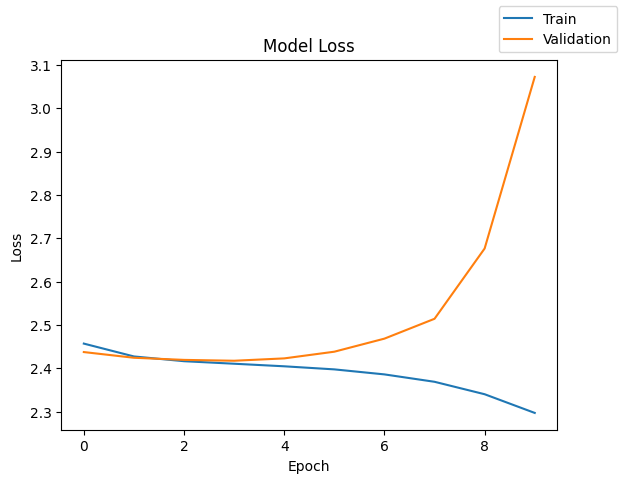

In [ ]:
plot(history1, 'loss')

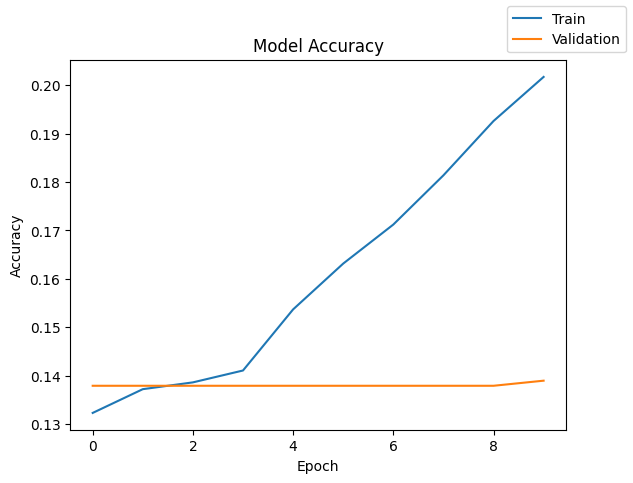

In [ ]:
plot(history1, 'accuracy')

In [ ]:
model1_train_perf = model_performance_classification(model1, X_train_normalized, y_train_encoded)
model1_train_perf

90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Accuracy,Recall,Precision,F1 Score
0,0.012281,0.012281,0.051213,0.019811


90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


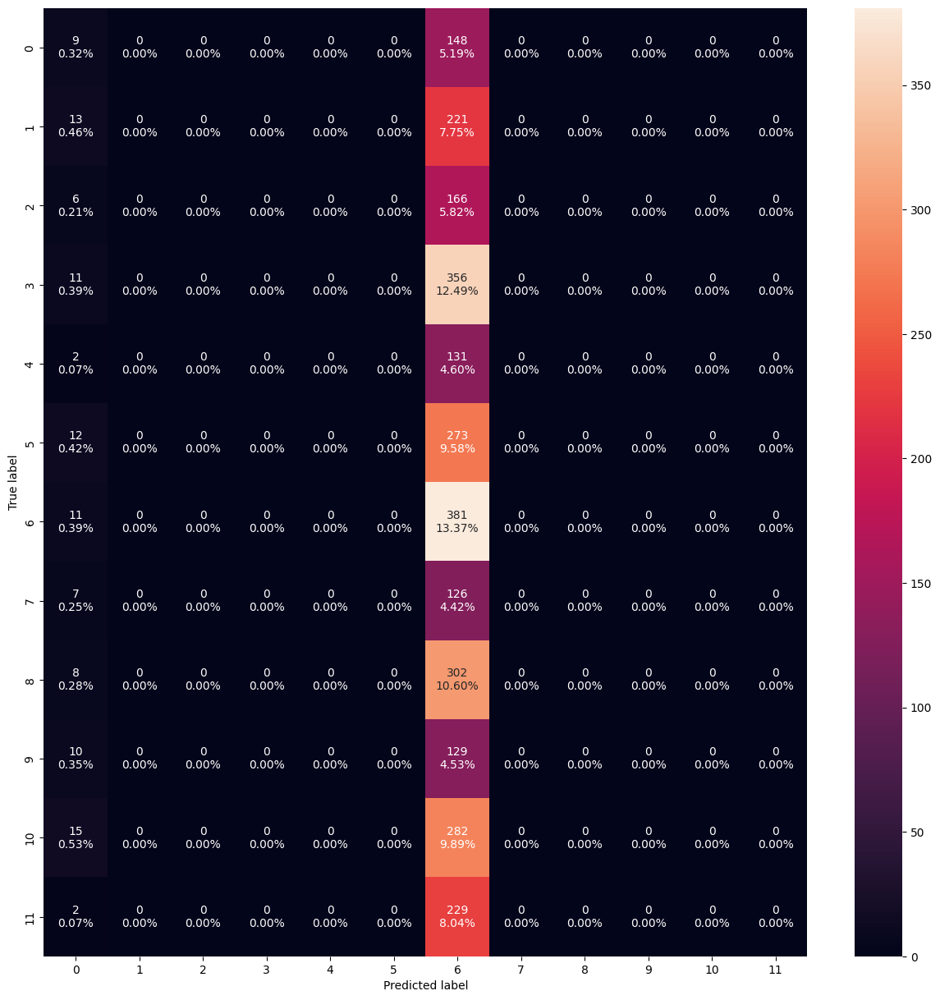

In [ ]:
confusion_matrix_sklearn(model1, X_train_normalized, y_train_encoded)

In [ ]:
model1_val_perf = model_performance_classification(model1, X_val_normalized, y_val_encoded)
model1_val_perf

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Accuracy,Recall,Precision,F1 Score
0,0.014737,0.014737,0.060329,0.023687


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


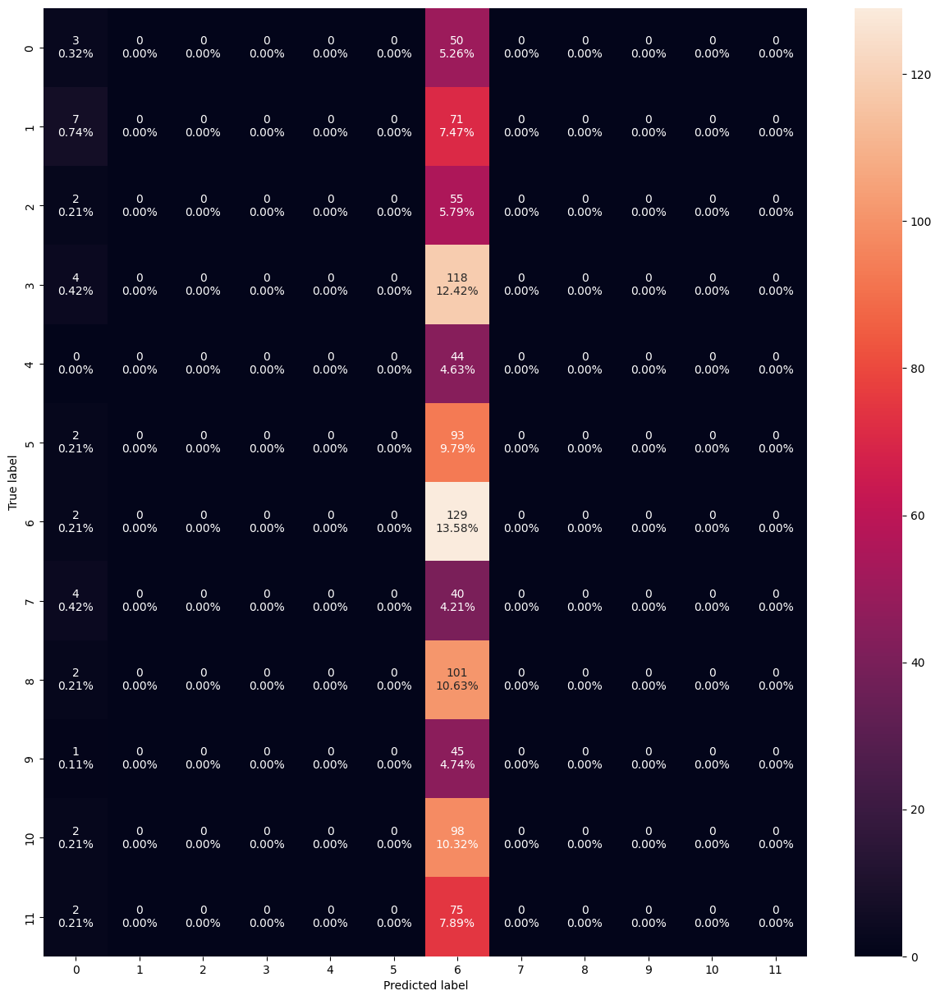

In [ ]:
confusion_matrix_sklearn(model1, X_val_normalized, y_val_encoded)

- The accuracy is not so good it is well below 50%.
- I will have to try tuning the model to increase the accuracy.

### Model 2 - optimizer=Adam - default learning_rate

In [ ]:
tf.keras.backend.clear_session() #clears current session, resetting all layers and model, freeing up memory

In [ ]:
model2 = Sequential()

model2.add(Conv2D(128, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model2.add(MaxPooling2D(pool_size=(2,2)))
model2.add(Conv2D(64, (3,3), padding='same', activation='relu'))
model2.add(MaxPooling2D(pool_size=(2,2)))
model2.add(Conv2D(32, (3,3), padding='same', activation='relu'))
model2.add(MaxPooling2D(pool_size=(2,2)))
model2.add(Flatten())
model2.add(Dense(128, activation='relu'))
model2.add(Dense(64, activation='relu'))
model2.add(Dense(12, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 128)         │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 12)                  │             780 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 367,148 (1.40 MB)

 Trainable params: 367,148 (1.40 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
optimizer = Adam()
model2.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start = time.time() #starting time
history2 = model2.fit(
    X_train_normalized,
    y_train_encoded,
    epochs=100,
    batch_size=32,
    validation_data=(X_val_normalized, y_val_encoded)
)
end = time.time() #ending time

Epoch 1/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - accuracy: 0.1140 - loss: 2.4474 - val_accuracy: 0.2653 - val_loss: 2.0784
Epoch 2/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3647 - loss: 1.8321 - val_accuracy: 0.4347 - val_loss: 1.6046
Epoch 3/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5073 - loss: 1.4321 - val_accuracy: 0.4979 - val_loss: 1.4156
Epoch 4/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6008 - loss: 1.1788 - val_accuracy: 0.6179 - val_loss: 1.1182
Epoch 5/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.6734 - loss: 0.9667 - val_accuracy: 0.6379 - val_loss: 1.0321
Epoch 6/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7073 - loss: 0.8648 - val_accuracy: 0.5905 - val_loss: 1.1862
Epoch 7/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7187 - loss: 0.8095 - val_accuracy: 0.6042 - val_loss: 1.1809
Epoch 8/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7324 - loss: 0.7627 - val_accuracy: 0.

In [ ]:
print(f"Time taken in seconds: {end-start} seconds")

Time taken in seconds: 123.60280418395996 seconds


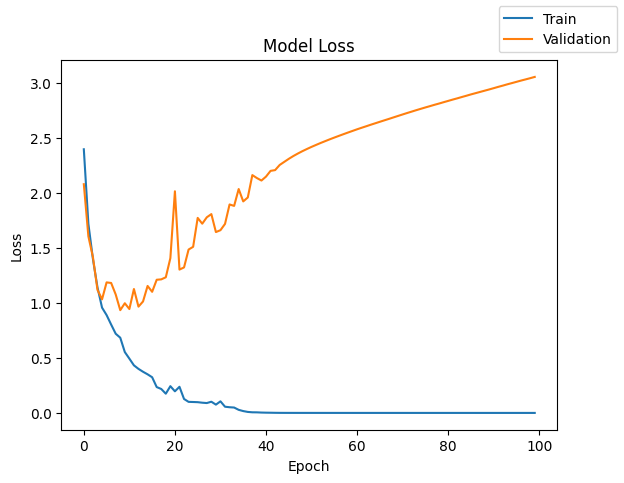

In [ ]:
plot(history2, 'loss')

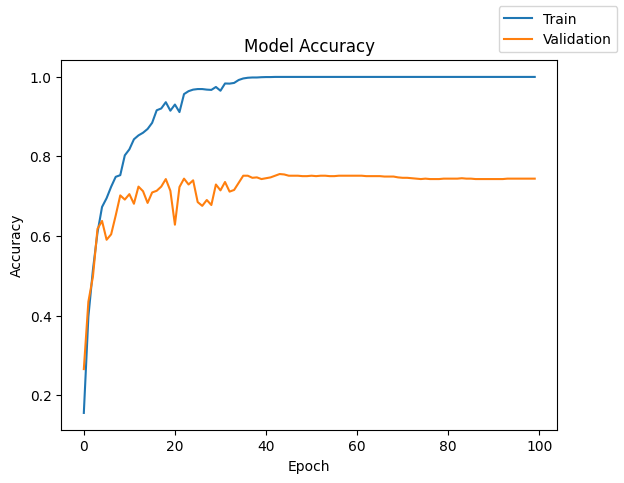

In [ ]:
plot(history2, 'accuracy')

In [ ]:
model2_train_perf = model_performance_classification(model2, X_train_normalized, y_train_encoded)
model2_train_perf

90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


,Accuracy,Recall,Precision,F1 Score
0,1.0,1.0,1.0,1.0


90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


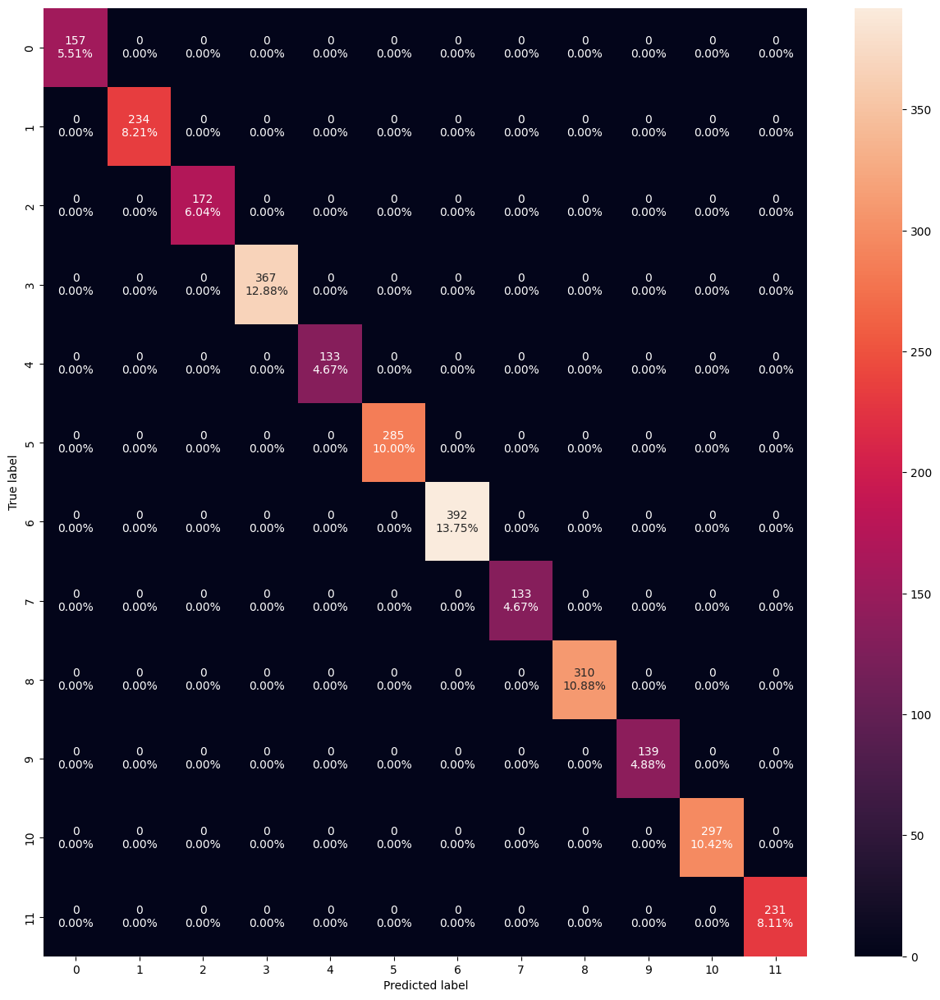

In [ ]:
confusion_matrix_sklearn(model2, X_train_normalized, y_train_encoded)

In [ ]:
model2_val_perf = model_performance_classification(model2, X_val_normalized, y_val_encoded)
model2_val_perf

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.743158,0.743158,0.742175,0.740426


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


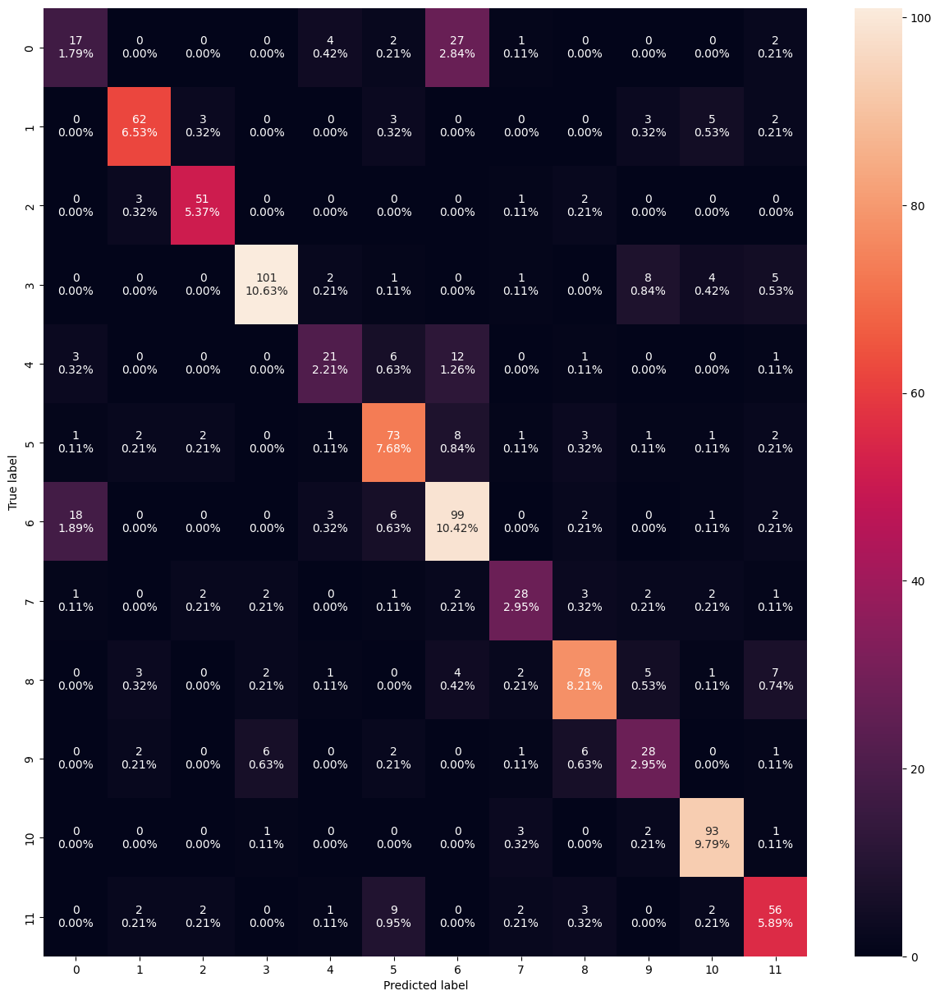

In [ ]:
confusion_matrix_sklearn(model2, X_val_normalized, y_val_encoded)

- The accuracy and recall are 100%, which is great in a perfect world.
- Unfortunetly, the model is clearly overfitting to the training data and doesn't do so well for the validation set.

### Model 3 - optimizer=Adam - decreased learning_rate=0.0001

In [ ]:
tf.keras.backend.clear_session() #clears current session, resetting all layers and model, freeing up memory

In [ ]:
model3 = Sequential()

model3.add(Conv2D(64, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model3.add(MaxPooling2D(pool_size=(2,2)))
model3.add(Conv2D(32, (3,3), padding='same', activation='relu'))
model3.add(MaxPooling2D(pool_size=(2,2)))
model3.add(Conv2D(8, (3,3), padding='same', activation='relu'))
model3.add(MaxPooling2D(pool_size=(2,2)))
model3.add(Flatten())
model3.add(Dense(64, activation='relu'))
model3.add(Dense(32, activation='relu'))
model3.add(Dense(12, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model3.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 8)           │           2,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 8)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 57,876 (226.08 KB)

 Trainable params: 57,876 (226.08 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
optimizer = Adam(learning_rate=0.0001)
model3.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start = time.time() #starting time
history3 = model3.fit(
    X_train_normalized,
    y_train_encoded,
    epochs=100,
    batch_size=32,
    validation_data=(X_val_normalized, y_val_encoded)
)
end = time.time() #ending time

Epoch 1/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - accuracy: 0.0996 - loss: 2.4746 - val_accuracy: 0.1337 - val_loss: 2.4320
Epoch 2/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.1349 - loss: 2.4248 - val_accuracy: 0.1358 - val_loss: 2.4173
Epoch 3/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1369 - loss: 2.4121 - val_accuracy: 0.1379 - val_loss: 2.4134
Epoch 4/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.1473 - loss: 2.4084 - val_accuracy: 0.1379 - val_loss: 2.4087
Epoch 5/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1614 - loss: 2.4004 - val_accuracy: 0.1495 - val_loss: 2.3868
Epoch 6/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1924 - loss: 2.3650 - val_accuracy: 0.2200 - val_loss: 2.2941
Epoch 7/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2270 - loss: 2.2630 - val_accuracy: 0.2484 - val_loss: 2.1777
Epoch 8/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2615 - loss: 2.1194 - val_accuracy: 0.2968 - 

In [ ]:
print(f"Time taken in seconds: {end-start} seconds")

Time taken in seconds: 113.12813019752502 seconds


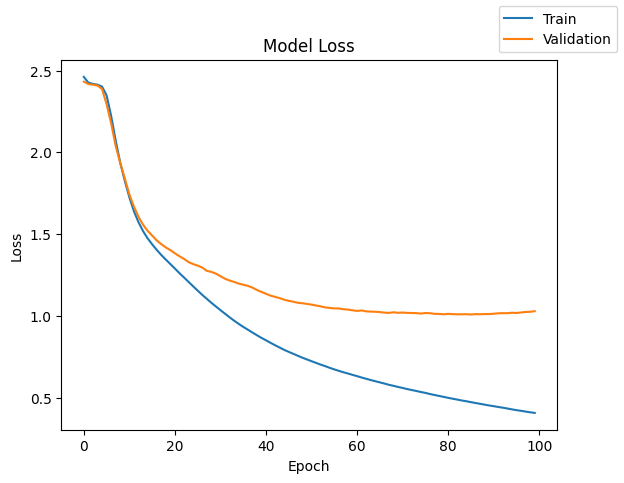

In [ ]:
plot(history3, 'loss')

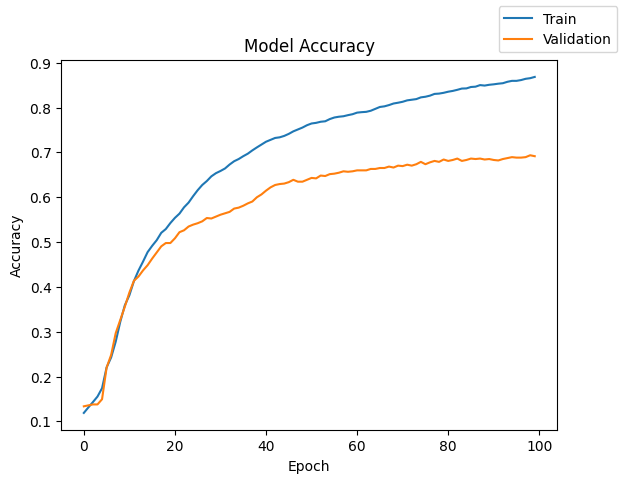

In [ ]:
plot(history3, 'accuracy')

In [ ]:
model3_train_perf = model_performance_classification(model3, X_train_normalized, y_train_encoded)
model3_train_perf

90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.828421,0.828421,0.908837,0.852189


90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


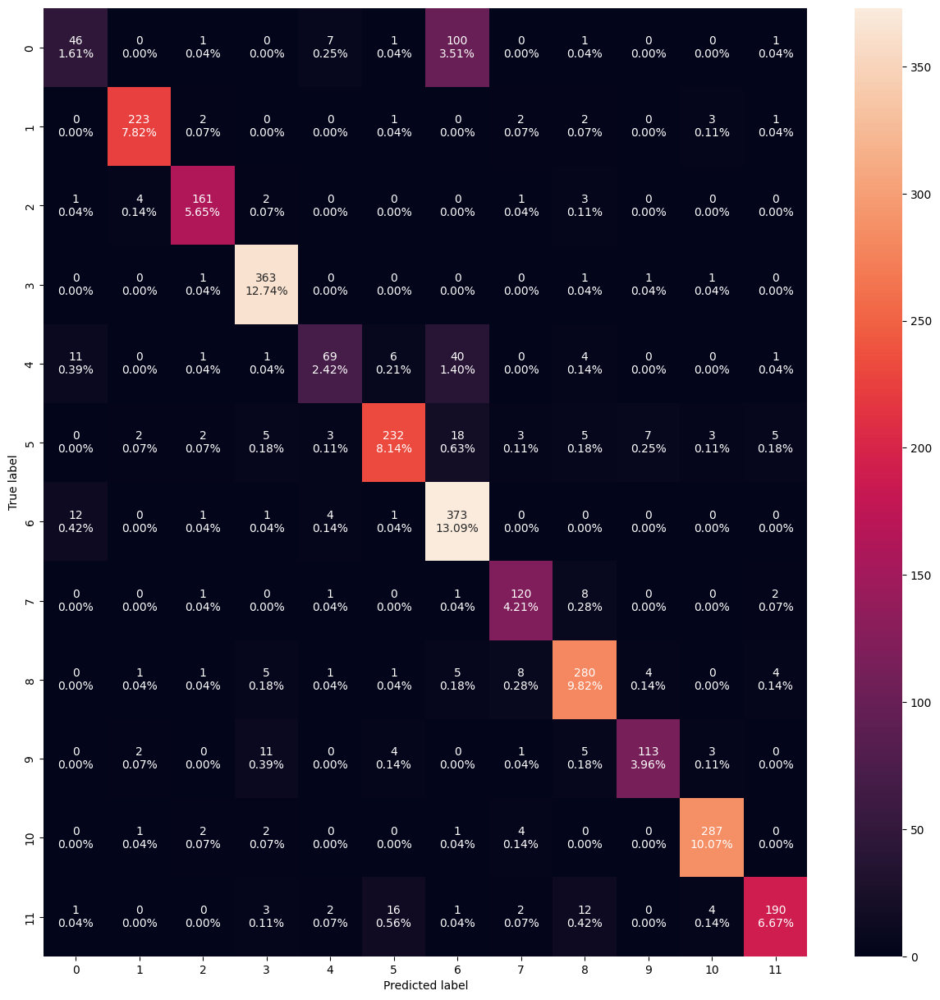

In [ ]:
confusion_matrix_sklearn(model3, X_train_normalized, y_train_encoded)

In [ ]:
model3_val_perf = model_performance_classification(model3, X_val_normalized, y_val_encoded)
model3_val_perf

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.656842,0.656842,0.708764,0.666903


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


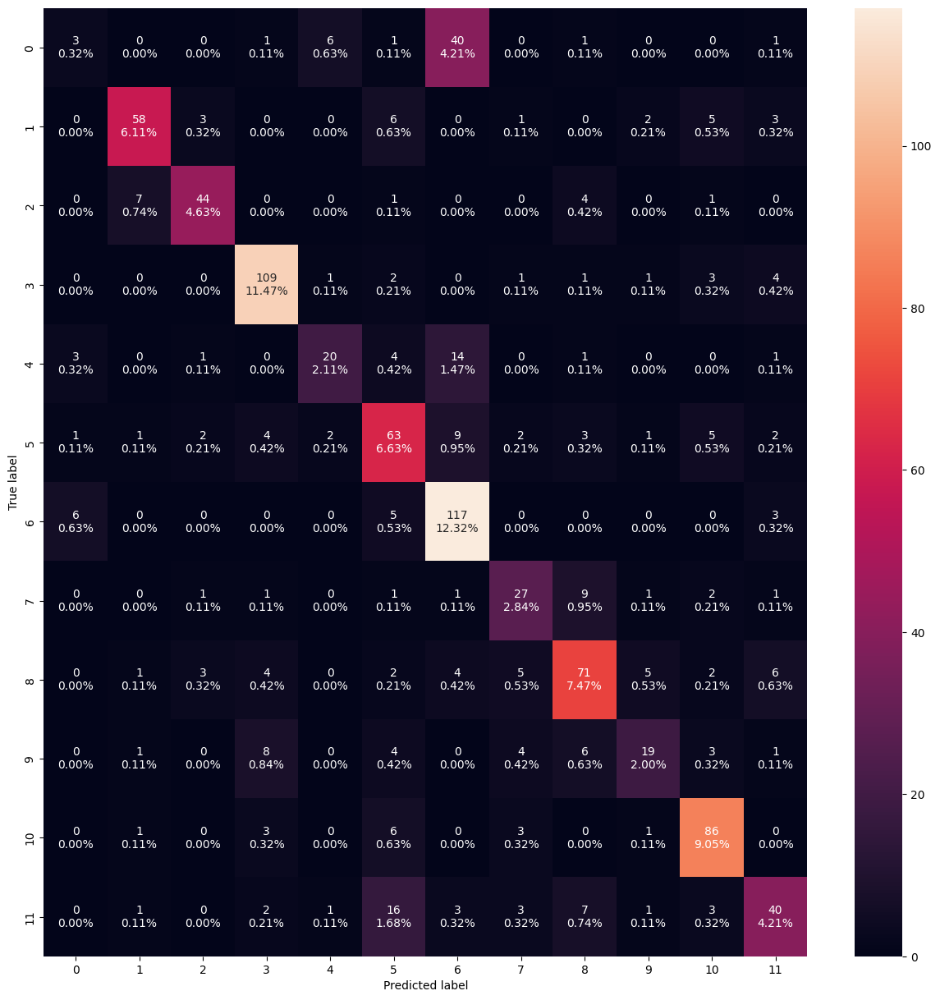

In [ ]:
confusion_matrix_sklearn(model3, X_val_normalized, y_val_encoded)

- The model is improving.
- The loss is decreasing and the accuracy is increasing.
- However, the accuracy and recall are pretty low.
- So, we have to fix that.
- Another this is that the model is somewhat overfitting to the training data.
- For this model, I changed the number of filters and decreased the learning_rate.
- The validation loss is starting to increase at epoch 60-70, and at the same epoch the accuracy is starting to decrease.

### Model 4 - optimizer=Adam - decreased learning_rate=0.0001 - new hidden layer(16)

In [ ]:
tf.keras.backend.clear_session() #clears current session, resetting all layers and model, freeing up memory

In [ ]:
model4 = Sequential()

model4.add(Conv2D(64, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model4.add(MaxPooling2D(pool_size=(2,2)))
model4.add(Conv2D(32, (3,3), padding='same', activation='relu'))
model4.add(MaxPooling2D(pool_size=(2,2)))
model4.add(Conv2D(8, (3,3), padding='same', activation='relu'))
model4.add(MaxPooling2D(pool_size=(2,2)))
model4.add(Flatten())
model4.add(Dense(64, activation='relu'))
model4.add(Dense(32, activation='relu'))
model4.add(Dense(16, activation='relu'))
model4.add(Dense(12, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model4.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 8)           │           2,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 8)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 58,212 (227.39 KB)

 Trainable params: 58,212 (227.39 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
optimizer = Adam(learning_rate=0.0001)
model4.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start = time.time() #starting time
history4 = model4.fit(
    X_train_normalized,
    y_train_encoded,
    epochs=100,
    batch_size=32,
    validation_data=(X_val_normalized, y_val_encoded)
)
end = time.time() #ending time

Epoch 1/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - accuracy: 0.1057 - loss: 2.4772 - val_accuracy: 0.1095 - val_loss: 2.4601
Epoch 2/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.1259 - loss: 2.4490 - val_accuracy: 0.1326 - val_loss: 2.4408
Epoch 3/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1463 - loss: 2.4292 - val_accuracy: 0.1474 - val_loss: 2.4265
Epoch 4/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1528 - loss: 2.4167 - val_accuracy: 0.1453 - val_loss: 2.4179
Epoch 5/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1545 - loss: 2.4085 - val_accuracy: 0.1463 - val_loss: 2.4086
Epoch 6/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1777 - loss: 2.3971 - val_accuracy: 0.1453 - val_loss: 2.3922
Epoch 7/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.1674 - loss: 2.3783 - val_accuracy: 0.1579 - val_loss: 2.3625
Epoch 8/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1742 - loss: 2.3533 - val_accuracy: 0.1684 - 

In [ ]:
print(f"Time taken in seconds: {end-start} seconds")

Time taken in seconds: 105.39844560623169 seconds


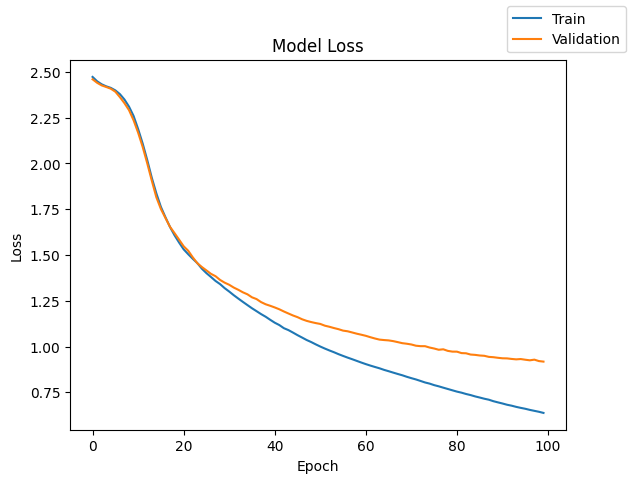

In [ ]:
plot(history4, 'loss')

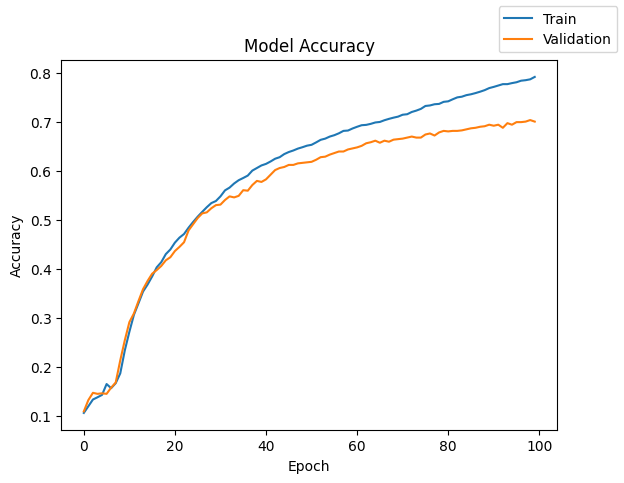

In [ ]:
plot(history4, 'accuracy')

In [ ]:
model4_train_perf = model_performance_classification(model4, X_train_normalized, y_train_encoded)
model4_train_perf

90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.714386,0.714386,0.851413,0.750911


90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


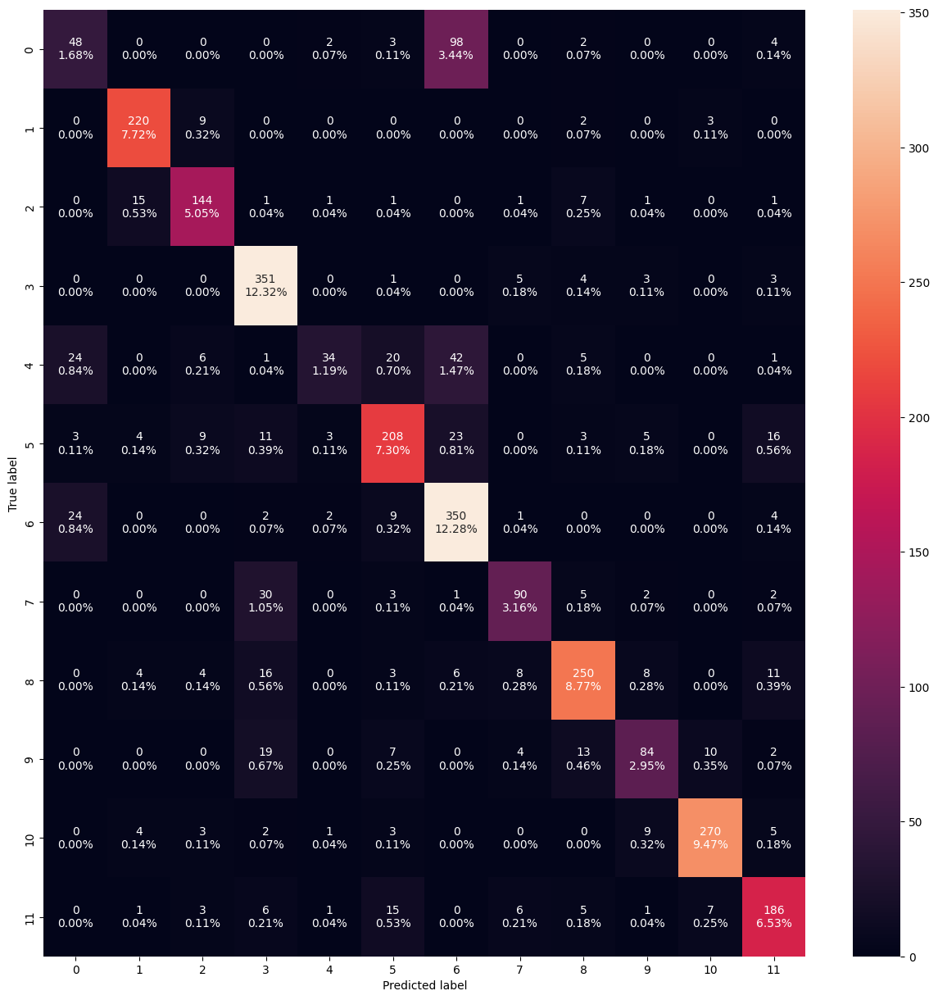

In [ ]:
confusion_matrix_sklearn(model4, X_train_normalized, y_train_encoded)

In [ ]:
model4_val_perf = model_performance_classification(model4, X_val_normalized, y_val_encoded)
model4_val_perf

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.622105,0.622105,0.741937,0.658046


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


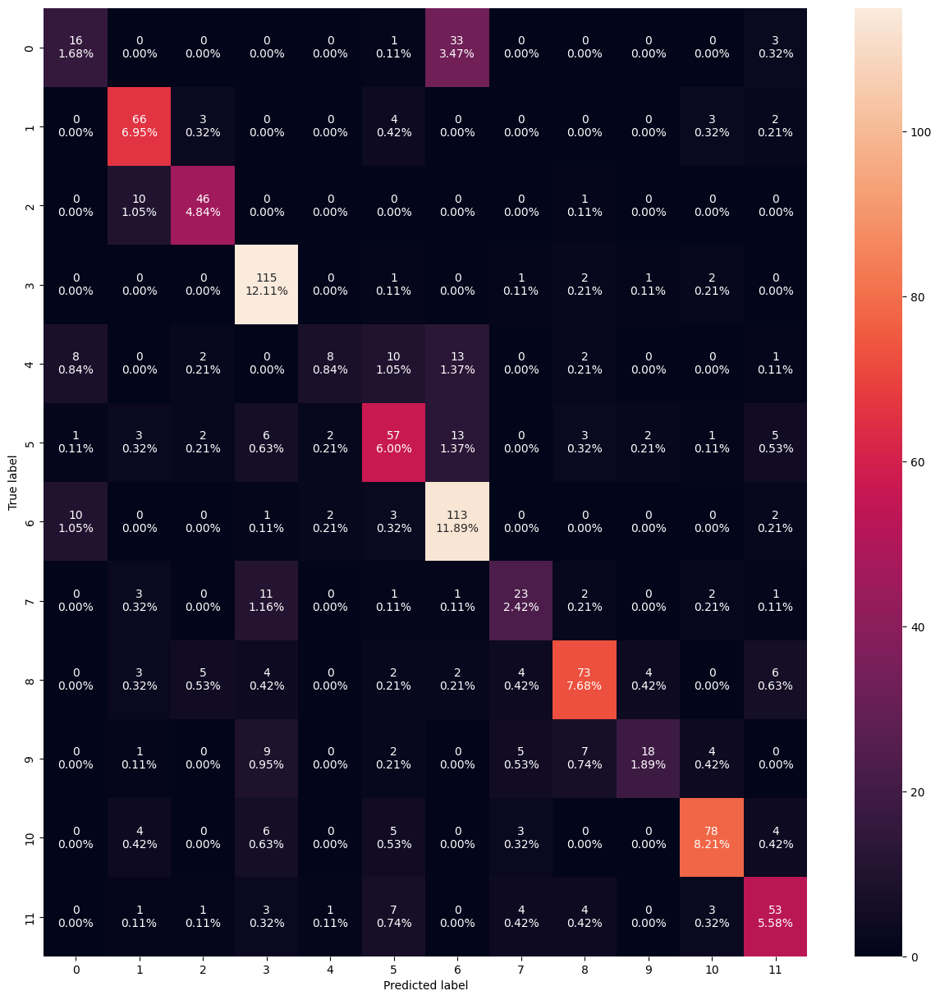

In [ ]:
confusion_matrix_sklearn(model4, X_val_normalized, y_val_encoded)

- The model is still overfitting to the training data.
- I added another dense layer to the neural network.
- This model is not it.

### Model 5 - optimizer=Adam - same as model 4 but added dropout

In [ ]:
tf.keras.backend.clear_session() #clears current session, resetting all layers and model, freeing up memory

In [ ]:
model5 = Sequential()

model5.add(Conv2D(124, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model5.add(MaxPooling2D(pool_size=(2,2)))
model5.add(Conv2D(32, (3,3), padding='same', activation='relu'))
model5.add(MaxPooling2D(pool_size=(2,2)))
model5.add(Conv2D(8, (3,3), padding='same', activation='relu'))
model5.add(MaxPooling2D(pool_size=(2,2)))
model5.add(Flatten())
model5.add(Dense(64, activation='relu'))
model5.add(Dropout(0.2))
model5.add(Dense(32, activation='relu'))
model5.add(Dropout(0.2))
model5.add(Dense(16, activation='relu'))
model5.add(Dropout(0.2))
model5.add(Dense(12, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model5.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 124)         │           3,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 124)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 32)          │          35,744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 8)           │           2,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 8)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 77,172 (301.45 KB)

 Trainable params: 77,172 (301.45 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
optimizer = Adam(learning_rate=0.0001)
model5.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start = time.time() #starting time
history5 = model5.fit(
    X_train_normalized,
    y_train_encoded,
    epochs=150,
    batch_size=32,
    validation_data=(X_val_normalized, y_val_encoded)
)
end = time.time() #ending time

Epoch 1/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.1122 - loss: 2.4740 - val_accuracy: 0.1379 - val_loss: 2.4499
Epoch 2/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.1380 - loss: 2.4500 - val_accuracy: 0.1379 - val_loss: 2.4355
Epoch 3/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.1365 - loss: 2.4457 - val_accuracy: 0.1379 - val_loss: 2.4301
Epoch 4/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.1405 - loss: 2.4337 - val_accuracy: 0.1389 - val_loss: 2.4075
Epoch 5/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.1464 - loss: 2.4149 - val_accuracy: 0.1389 - val_loss: 2.3833
Epoch 6/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.1787 - loss: 2.4030 - val_accuracy: 0.2032 - val_loss: 2.3298
Epoch 7/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.2245 - loss: 2.3404 - val_accuracy: 0.2484 - val_loss: 2.2373
Epoch 8/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.2429 - loss: 2.2699 - val_accuracy: 0

In [ ]:
print(f"Time taken in seconds: {end-start} seconds")

Time taken in seconds: 177.58016848564148 seconds


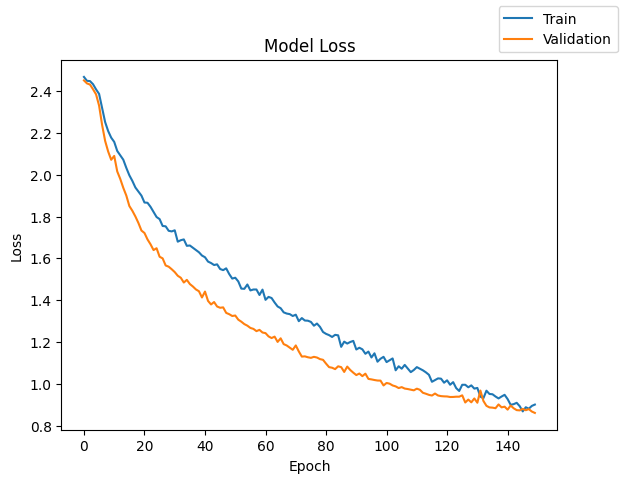

In [ ]:
plot(history5, 'loss')

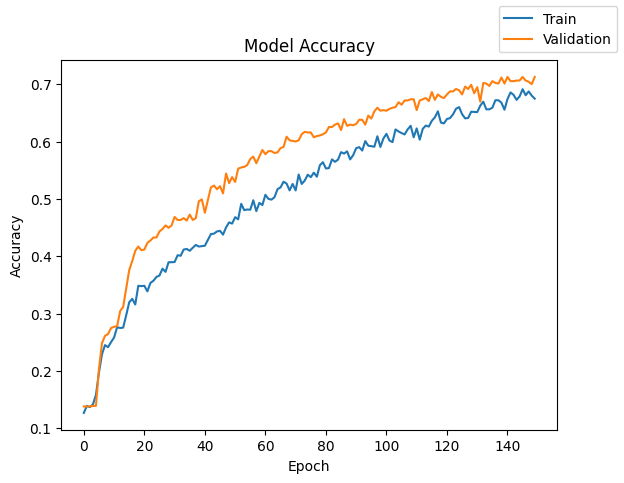

In [ ]:
plot(history5, 'accuracy')

In [ ]:
model5_train_perf = model_performance_classification(model5, X_train_normalized, y_train_encoded)
model5_train_perf

90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Accuracy,Recall,Precision,F1 Score
0,0.692632,0.692632,0.828392,0.734966


90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


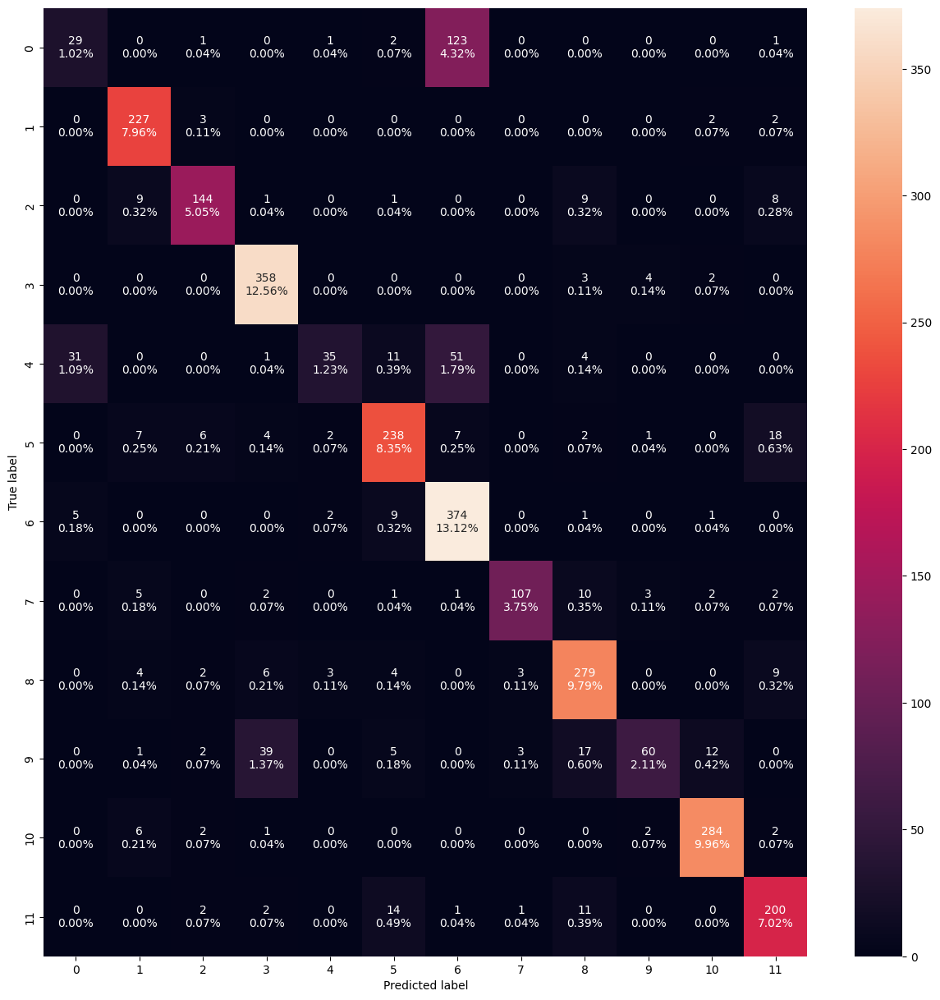

In [ ]:
confusion_matrix_sklearn(model5, X_train_normalized, y_train_encoded)

In [ ]:
model5_val_perf = model_performance_classification(model5, X_val_normalized, y_val_encoded)
model5_val_perf

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Accuracy,Recall,Precision,F1 Score
0,0.589474,0.589474,0.731136,0.635587


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


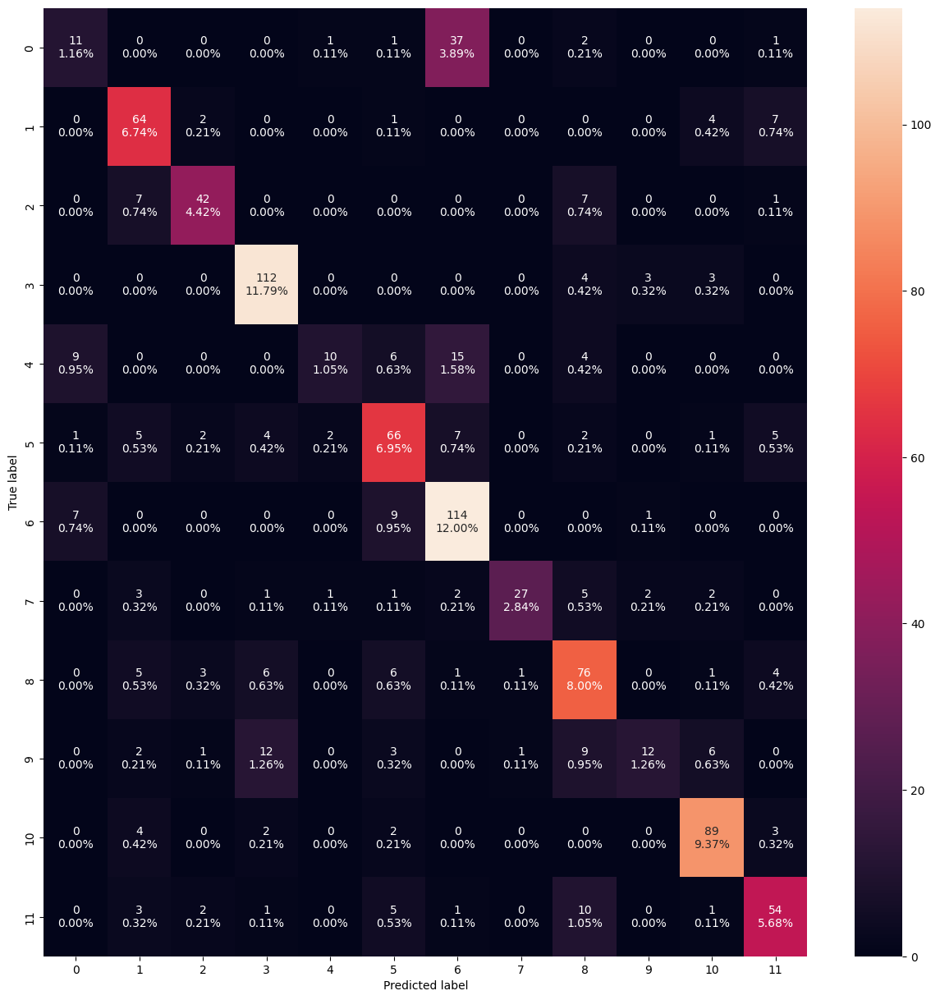

In [ ]:
confusion_matrix_sklearn(model5, X_val_normalized, y_val_encoded)

- This model is somewhat good.
- It is still overfitting but the validation set is close to the training set.
- If we use this architecture and fine tune some hyperparameters the model can improve.

### Model 6 - optimizer=Adam - same as model 5 but added batchnormalization

In [ ]:
tf.keras.backend.clear_session() #clears current session, resetting all layers and model, freeing up memory

In [ ]:
model6 = Sequential()

model6.add(Conv2D(124, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model6.add(MaxPooling2D(pool_size=(2,2)))
model6.add(BatchNormalization())
model6.add(Conv2D(32, (3,3), padding='same', activation='relu'))
model6.add(MaxPooling2D(pool_size=(2,2)))
model6.add(Conv2D(8, (3,3), padding='same', activation='relu'))
model6.add(MaxPooling2D(pool_size=(2,2)))
model6.add(Flatten())
model6.add(Dense(64, activation='relu'))
#model6.add(BatchNormalization())
model6.add(Dropout(0.2))
model6.add(Dense(32, activation='relu'))
#model6.add(BatchNormalization())
model6.add(Dropout(0.2))
model6.add(Dense(16, activation='relu'))
#model6.add(BatchNormalization())
model6.add(Dropout(0.2))
model6.add(Dense(12, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model6.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 124)         │           3,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 124)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 32, 32, 124)         │             496 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 32)          │          35,744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 8)           │           2,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 8)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 77,668 (303.39 KB)

 Trainable params: 77,420 (302.42 KB)

 Non-trainable params: 248 (992.00 B)

In [ ]:
optimizer = Adam(learning_rate=0.0001)
model6.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start = time.time() #starting time
history6 = model6.fit(
    X_train_normalized,
    y_train_encoded,
    epochs=150,
    batch_size=32,
    validation_data=(X_val_normalized, y_val_encoded)
)
end = time.time() #ending time

Epoch 1/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - accuracy: 0.0638 - loss: 2.5253 - val_accuracy: 0.1147 - val_loss: 2.4829
Epoch 2/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.0846 - loss: 2.4890 - val_accuracy: 0.1358 - val_loss: 2.4809
Epoch 3/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.0908 - loss: 2.4766 - val_accuracy: 0.1421 - val_loss: 2.4779
Epoch 4/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1022 - loss: 2.4663 - val_accuracy: 0.1705 - val_loss: 2.4700
Epoch 5/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.1264 - loss: 2.4430 - val_accuracy: 0.2084 - val_loss: 2.4456
Epoch 6/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.1468 - loss: 2.3973 - val_accuracy: 0.1853 - val_loss: 2.3884
Epoch 7/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1524 - loss: 2.3371 - val_accuracy: 0.2389 - val_loss: 2.2897
Epoch 8/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1849 - loss: 2.2714 - val_accuracy: 0

In [ ]:
print(f"Time taken in seconds: {end-start} seconds")

Time taken in seconds: 188.04932260513306 seconds


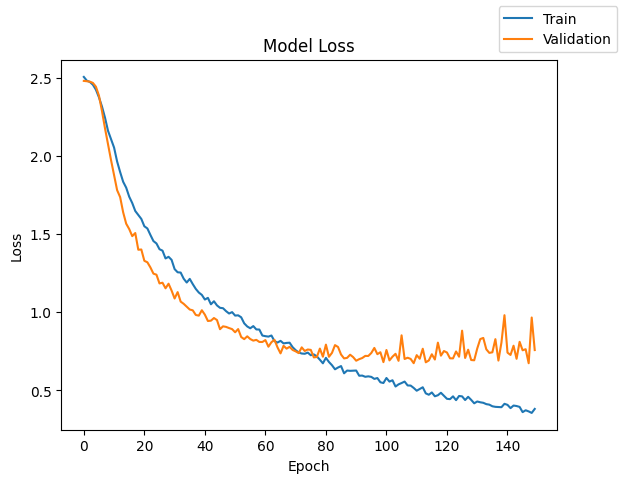

In [ ]:
plot(history6, 'loss')

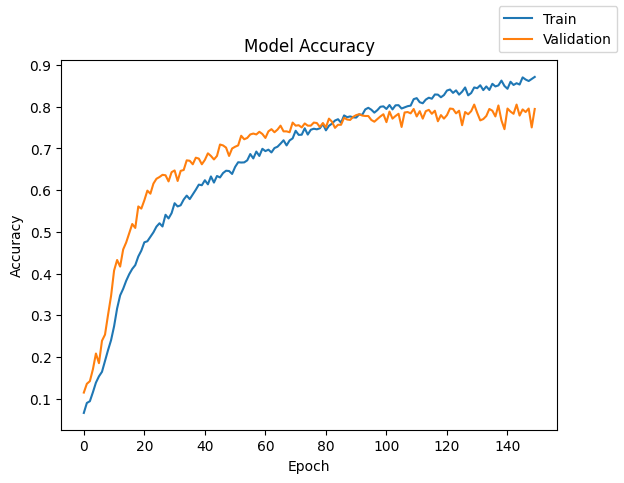

In [ ]:
plot(history6, 'accuracy')

In [ ]:
model6_train_perf = model_performance_classification(model6, X_train_normalized, y_train_encoded)
model6_train_perf

90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.933333,0.933333,0.963491,0.938943


90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


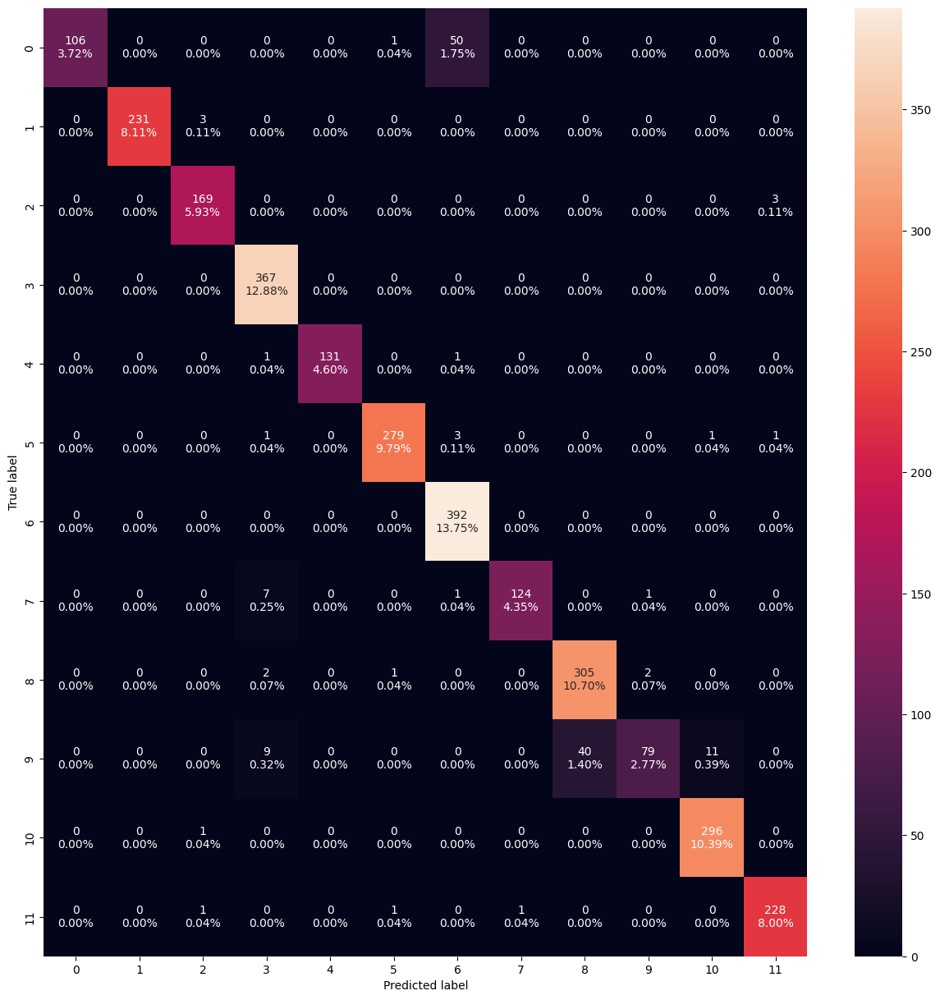

In [ ]:
confusion_matrix_sklearn(model6, X_train_normalized, y_train_encoded)

In [ ]:
model6_val_perf = model_performance_classification(model6, X_val_normalized, y_val_encoded)
model6_val_perf

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.773684,0.773684,0.831058,0.787379


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


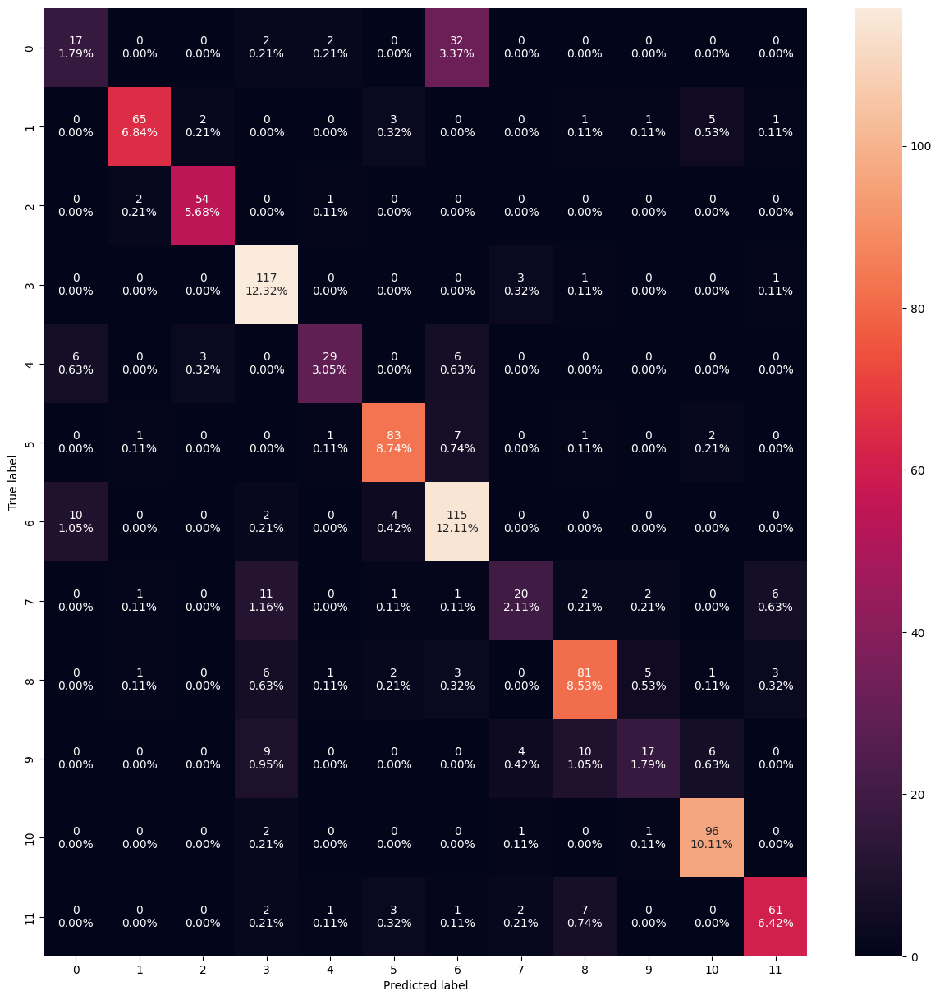

In [ ]:
confusion_matrix_sklearn(model6, X_val_normalized, y_val_encoded)

### Model 7 - optimizer=Adam - same as model 6 but added more batchnormalization

In [ ]:
tf.keras.backend.clear_session() #clears current session, resetting all layers and model, freeing up memory

In [ ]:
model7 = Sequential()

model7.add(Conv2D(124, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model7.add(MaxPooling2D(pool_size=(2,2)))
model7.add(BatchNormalization())
model7.add(Conv2D(32, (3,3), padding='same', activation='relu'))
model7.add(MaxPooling2D(pool_size=(2,2)))
model7.add(BatchNormalization())
model7.add(Conv2D(8, (3,3), padding='same', activation='relu'))
model7.add(MaxPooling2D(pool_size=(2,2)))
model7.add(Flatten())
model7.add(Dense(64, activation='relu'))
#model7.add(BatchNormalization())
model7.add(Dropout(0.2))
model7.add(Dense(32, activation='relu'))
#model7.add(BatchNormalization())
model7.add(Dropout(0.2))
model7.add(Dense(16, activation='relu'))
#model7.add(BatchNormalization())
model7.add(Dropout(0.2))
model7.add(Dense(12, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model7.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 124)         │           3,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 124)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 32, 32, 124)         │             496 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 32)          │          35,744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 8)           │           2,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 8)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 77,796 (303.89 KB)

 Trainable params: 77,484 (302.67 KB)

 Non-trainable params: 312 (1.22 KB)

In [ ]:
optimizer = Adam(learning_rate=0.0001)
model7.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start = time.time() #starting time
history7 = model7.fit(
    X_train_normalized,
    y_train_encoded,
    epochs=150,
    batch_size=32,
    validation_data=(X_val_normalized, y_val_encoded)
)
end = time.time() #ending time

Epoch 1/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - accuracy: 0.0991 - loss: 2.6181 - val_accuracy: 0.1011 - val_loss: 2.4793
Epoch 2/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1259 - loss: 2.4333 - val_accuracy: 0.1011 - val_loss: 2.4706
Epoch 3/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1373 - loss: 2.3646 - val_accuracy: 0.1011 - val_loss: 2.4614
Epoch 4/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1771 - loss: 2.2776 - val_accuracy: 0.1011 - val_loss: 2.4585
Epoch 5/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.2055 - loss: 2.2123 - val_accuracy: 0.1158 - val_loss: 2.4305
Epoch 6/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2336 - loss: 2.1414 - val_accuracy: 0.1779 - val_loss: 2.3200
Epoch 7/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.2520 - loss: 2.0765 - val_accuracy: 0.2789 - val_loss: 2.1059
Epoch 8/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.2626 - loss: 2.0404 - val_accuracy: 0

In [ ]:
print(f"Time taken in seconds: {end-start} seconds")

Time taken in seconds: 193.4264361858368 seconds


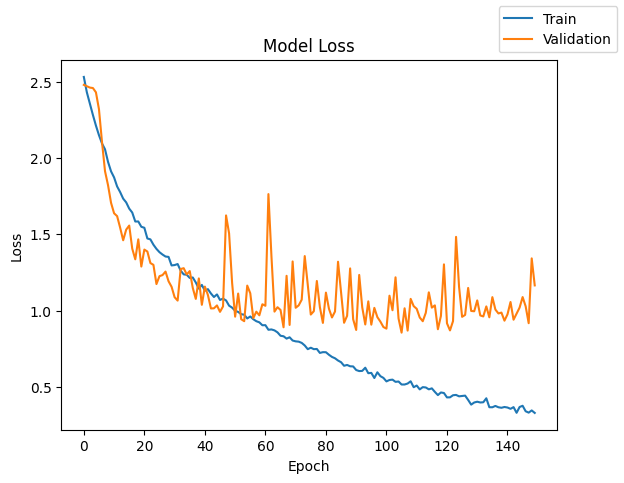

In [ ]:
plot(history7, 'loss')

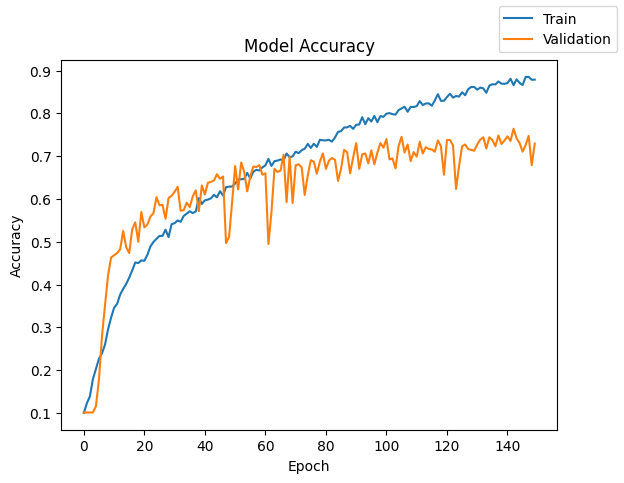

In [ ]:
plot(history7, 'accuracy')

In [ ]:
model7_train_perf = model_performance_classification(model7, X_train_normalized, y_train_encoded)
model7_train_perf

90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.925263,0.925263,0.95727,0.935075


90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


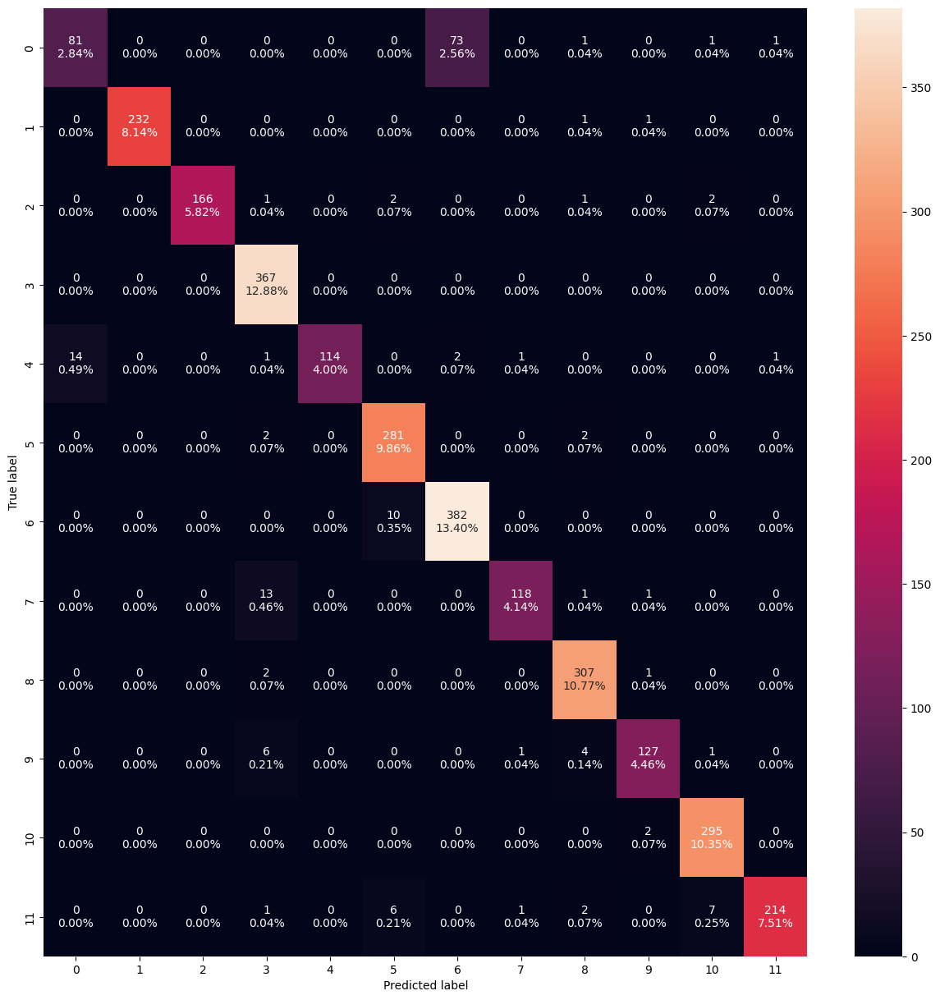

In [ ]:
confusion_matrix_sklearn(model7, X_train_normalized, y_train_encoded)

In [ ]:
model7_val_perf = model_performance_classification(model7, X_val_normalized, y_val_encoded)
model7_val_perf

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.711579,0.711579,0.758437,0.716624


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


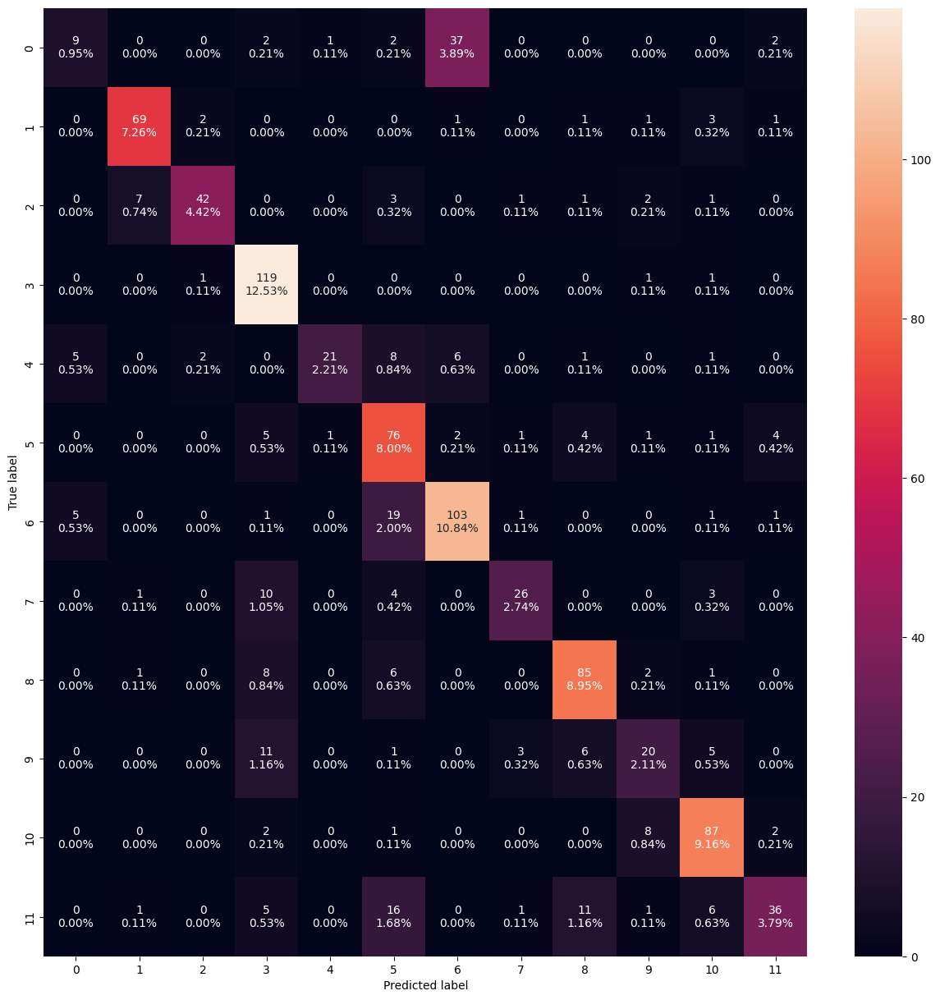

In [ ]:
confusion_matrix_sklearn(model7, X_val_normalized, y_val_encoded)

- There is still some overfitting happening.

### Model 8 - optimizer=Adam - same as model 7 but added more batchnormalization

In [ ]:
tf.keras.backend.clear_session() #clears current session, resetting all layers and model, freeing up memory

In [ ]:
model8 = Sequential()

model8.add(Conv2D(124, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model8.add(MaxPooling2D(pool_size=(2,2)))
model8.add(BatchNormalization())
model8.add(Conv2D(32, (3,3), padding='same', activation='relu'))
model8.add(MaxPooling2D(pool_size=(2,2)))
model8.add(BatchNormalization())
model8.add(Conv2D(8, (3,3), padding='same', activation='relu'))
model8.add(MaxPooling2D(pool_size=(2,2)))
model8.add(BatchNormalization())
model8.add(Flatten())
model8.add(Dense(64, activation='relu'))
model8.add(BatchNormalization())
model8.add(Dropout(0.2))
model8.add(Dense(32, activation='relu'))
model8.add(BatchNormalization())
model8.add(Dropout(0.2))
model8.add(Dense(16, activation='relu'))
model8.add(BatchNormalization())
model8.add(Dropout(0.2))
model8.add(Dense(12, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model8.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 124)         │           3,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 124)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 32, 32, 124)         │             496 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 32)          │          35,744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 8)           │           2,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 8)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 8, 8, 8)             │              32 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 16)                  │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 78,276 (305.77 KB)

 Trainable params: 77,724 (303.61 KB)

 Non-trainable params: 552 (2.16 KB)

In [ ]:
optimizer = Adam(learning_rate=0.0001)
model8.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start = time.time() #starting time
history8 = model8.fit(
    X_train_normalized,
    y_train_encoded,
    epochs=150,
    batch_size=32,
    validation_data=(X_val_normalized, y_val_encoded)
)
end = time.time() #ending time

Epoch 1/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - accuracy: 0.0840 - loss: 3.0984 - val_accuracy: 0.1284 - val_loss: 2.4830
Epoch 2/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.1096 - loss: 2.9123 - val_accuracy: 0.1284 - val_loss: 2.5474
Epoch 3/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1256 - loss: 2.7994 - val_accuracy: 0.1284 - val_loss: 2.5950
Epoch 4/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1471 - loss: 2.7185 - val_accuracy: 0.1284 - val_loss: 2.5701
Epoch 5/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1368 - loss: 2.7037 - val_accuracy: 0.1400 - val_loss: 2.4832
Epoch 6/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1649 - loss: 2.5925 - val_accuracy: 0.1495 - val_loss: 2.4294
Epoch 7/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.1679 - loss: 2.5234 - val_accuracy: 0.1747 - val_loss: 2.3796
Epoch 8/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.2044 - loss: 2.4290 - val_accuracy: 0

In [ ]:
print(f"Time taken in seconds: {end-start} seconds")

Time taken in seconds: 200.33974957466125 seconds


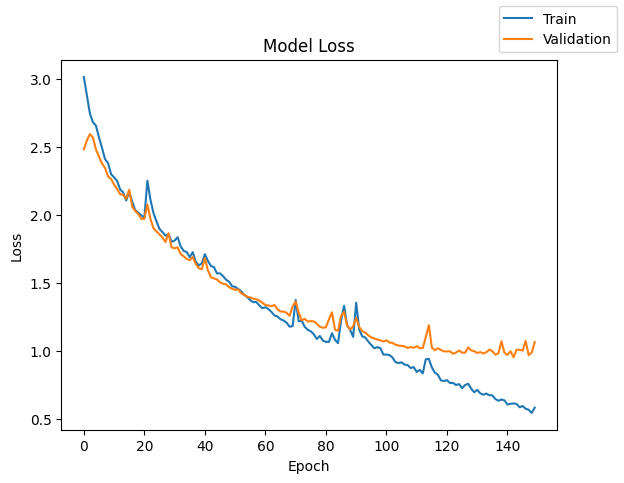

In [ ]:
plot(history8, 'loss')

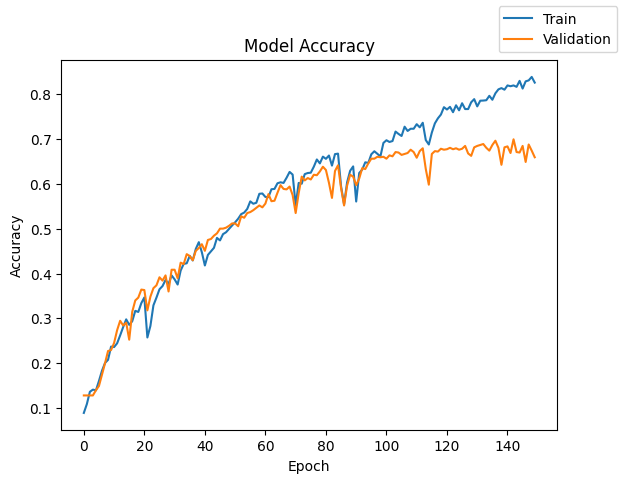

In [ ]:
plot(history8, 'accuracy')

In [ ]:
model8_train_perf = model_performance_classification(model8, X_train_normalized, y_train_encoded)
model8_train_perf

90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.849825,0.849825,0.947203,0.890052


90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


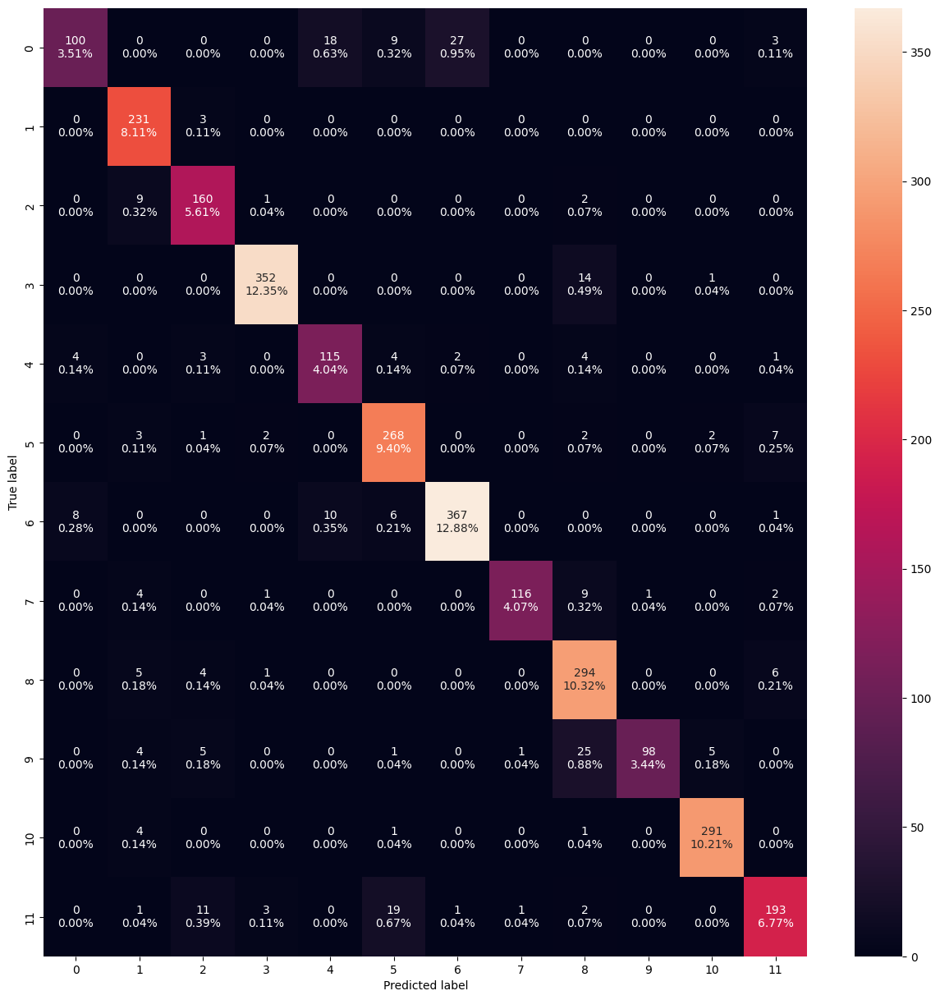

In [ ]:
confusion_matrix_sklearn(model8, X_train_normalized, y_train_encoded)

In [ ]:
model8_val_perf = model_performance_classification(model8, X_val_normalized, y_val_encoded)
model8_val_perf

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.58,0.58,0.766679,0.642094


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


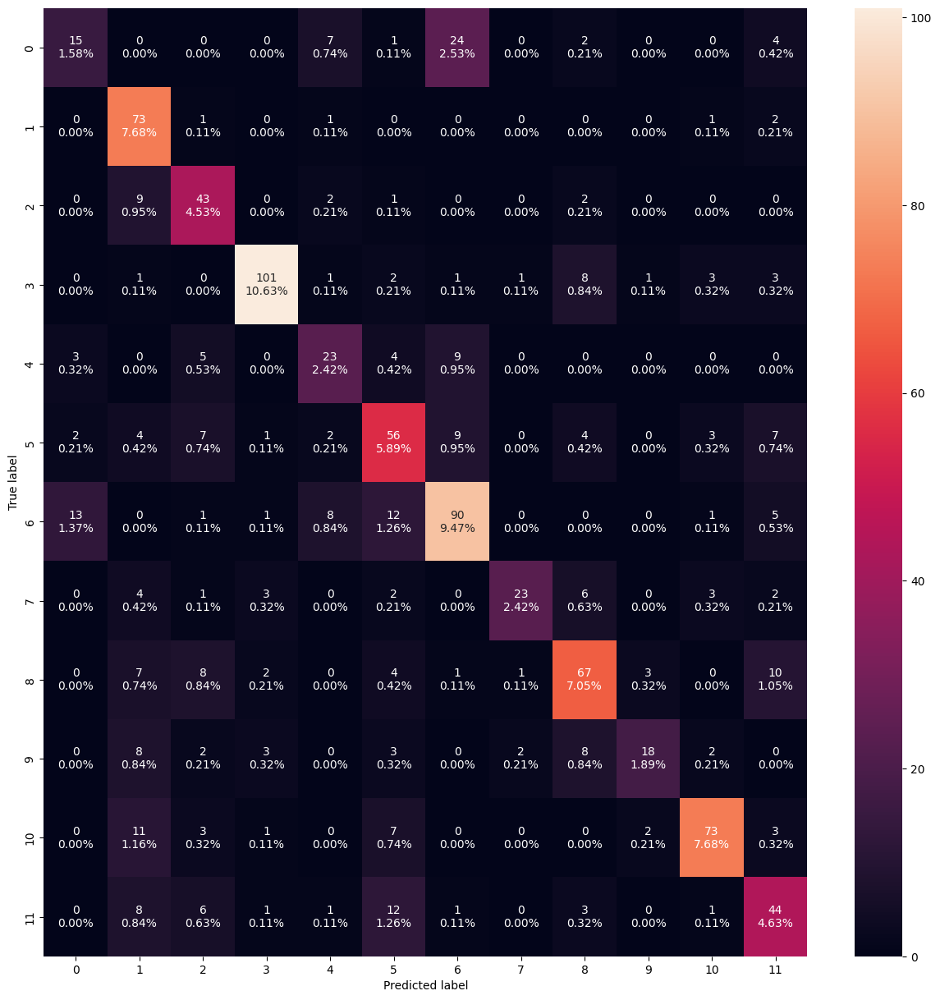

In [ ]:
confusion_matrix_sklearn(model8, X_val_normalized, y_val_encoded)

## Model Performance Improvement

**Reducing the Learning Rate:**

**Hint**: Use **ReduceLRonPlateau()** function that will be used to decrease the learning rate by some factor, if the loss is not decreasing for some time. This may start decreasing the loss at a smaller learning rate. There is a possibility that the loss may still not decrease. This may lead to executing the learning rate reduction again in an attempt to achieve a lower loss.

### **Data Augmentation**

Remember, **data augmentation should not be used in the validation/test data set**.

In [ ]:
image_gen = ImageDataGenerator(
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

### Model 9 - optimizer=Adam - same as model 8

In [ ]:
tf.keras.backend.clear_session() #clears current session, resetting all layers and model, freeing up memory

In [ ]:
model9 = Sequential()

model9.add(Conv2D(124, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model9.add(MaxPooling2D(pool_size=(2,2)))
model9.add(Conv2D(32, (3,3), padding='same', activation='relu'))
model9.add(MaxPooling2D(pool_size=(2,2)))
model9.add(Conv2D(8, (3,3), padding='same', activation='relu'))
model9.add(MaxPooling2D(pool_size=(2,2)))
model9.add(Flatten())
model9.add(Dense(64, activation='relu'))
model9.add(Dropout(0.2))
model9.add(Dense(32, activation='relu'))
model9.add(Dropout(0.2))
model9.add(Dense(16, activation='relu'))
model9.add(Dropout(0.2))
model9.add(Dense(12, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model9.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 124)         │           3,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 124)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 32)          │          35,744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 8)           │           2,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 8)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 77,172 (301.45 KB)

 Trainable params: 77,172 (301.45 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
optimizer = Adam(learning_rate=0.0001)
model9.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start = time.time() #starting time
history9 = model9.fit(image_gen.flow(
    X_train_normalized,
    y_train_encoded,
    batch_size=32,
    seed=42,
    shuffle=False),
    epochs=250,
    validation_data=(X_val_normalized, y_val_encoded),
    steps_per_epoch=X_train_normalized.shape[0] // 32,
    verbose=1
)
end = time.time() #ending time

Epoch 1/250


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


89/89 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - accuracy: 0.0809 - loss: 2.4834 - val_accuracy: 0.0916 - val_loss: 2.4577
Epoch 2/250
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0938 - loss: 2.4722 - val_accuracy: 0.0916 - val_loss: 2.4572
Epoch 3/250


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


89/89 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - accuracy: 0.0892 - loss: 2.4590 - val_accuracy: 0.1032 - val_loss: 2.4484
Epoch 4/250
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0000e+00 - loss: 2.4782 - val_accuracy: 0.1021 - val_loss: 2.4482
Epoch 5/250
89/89 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - accuracy: 0.1021 - loss: 2.4584 - val_accuracy: 0.1263 - val_loss: 2.4421
Epoch 6/250
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0312 - loss: 2.4443 - val_accuracy: 0.1200 - val_loss: 2.4421
Epoch 7/250
89/89 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.1070 - loss: 2.4516 - val_accuracy: 0.1295 - val_loss: 2.4366
Epoch 8/250
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0938 - loss: 2.4804 - val_accuracy: 0.1284 - val_loss: 2.4366
Epoch 9/250
89/89 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - accuracy: 0.1031 - loss: 2.4561 - val_accuracy: 0.1284 - val_loss: 2.4319
Epoch 10/250
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0000e+00 - loss: 2.5112 - val_accuracy: 0.1284 -

In [ ]:
print(f"Time taken in seconds: {end-start} seconds")

Time taken in seconds: 730.6371865272522 seconds


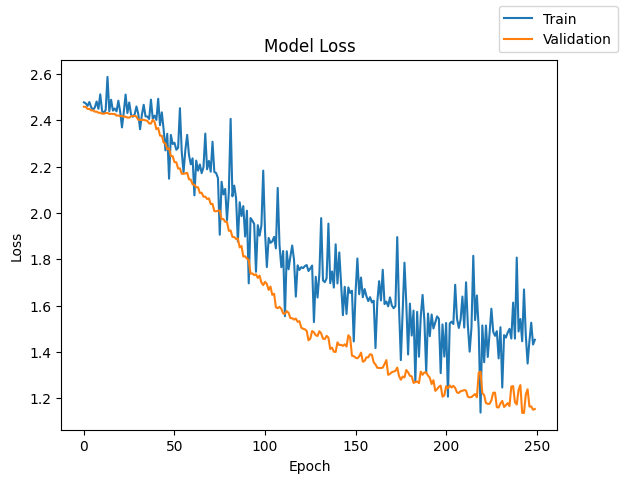

In [ ]:
plot(history9, 'loss')

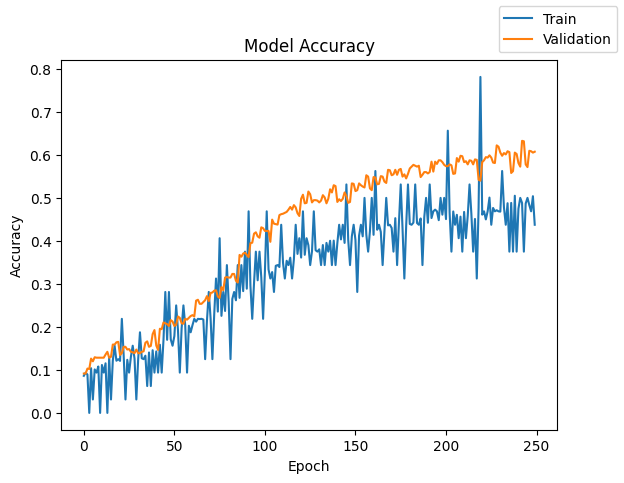

In [ ]:
plot(history9, 'accuracy')

In [ ]:
model9_train_perf = model_performance_classification(model9, X_train_normalized, y_train_encoded)
model9_train_perf

90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Accuracy,Recall,Precision,F1 Score
0,0.394386,0.394386,0.60172,0.426906


90/90 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


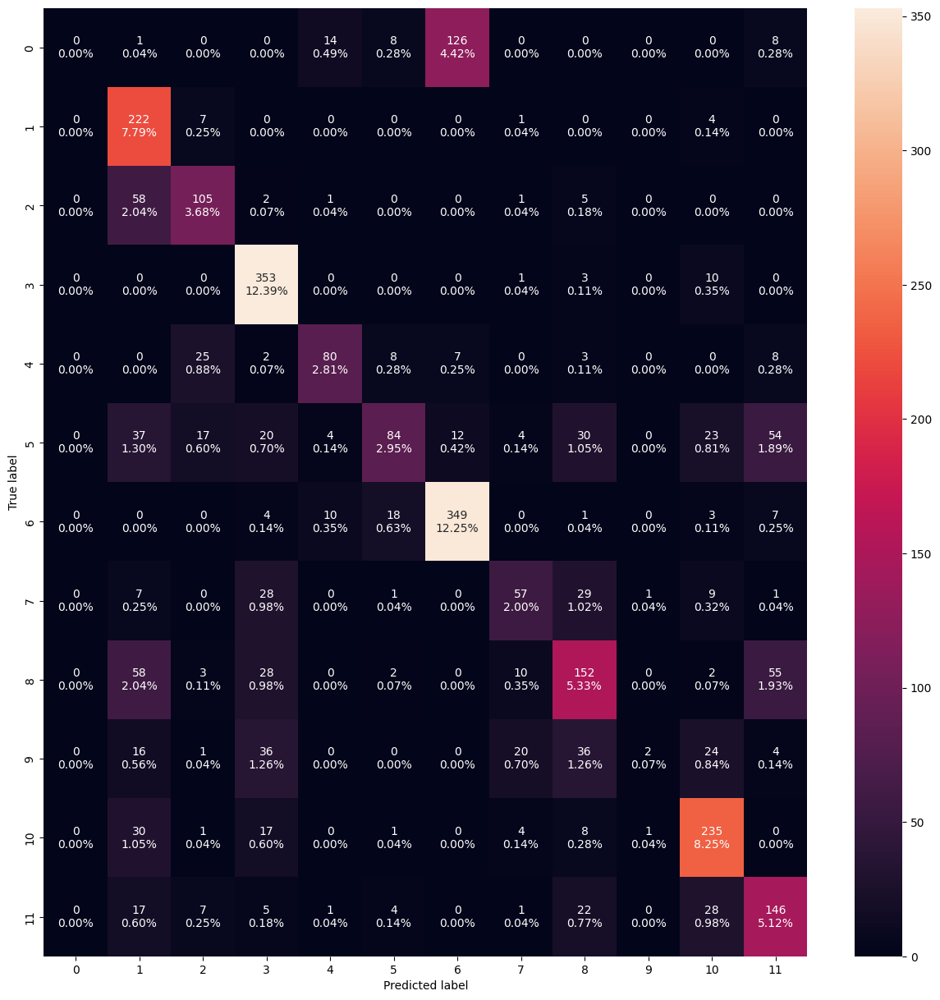

In [ ]:
confusion_matrix_sklearn(model9, X_train_normalized, y_train_encoded)

In [ ]:
model9_val_perf = model_performance_classification(model9, X_val_normalized, y_val_encoded)
model9_val_perf

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Accuracy,Recall,Precision,F1 Score
0,0.377895,0.377895,0.511294,0.410684


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


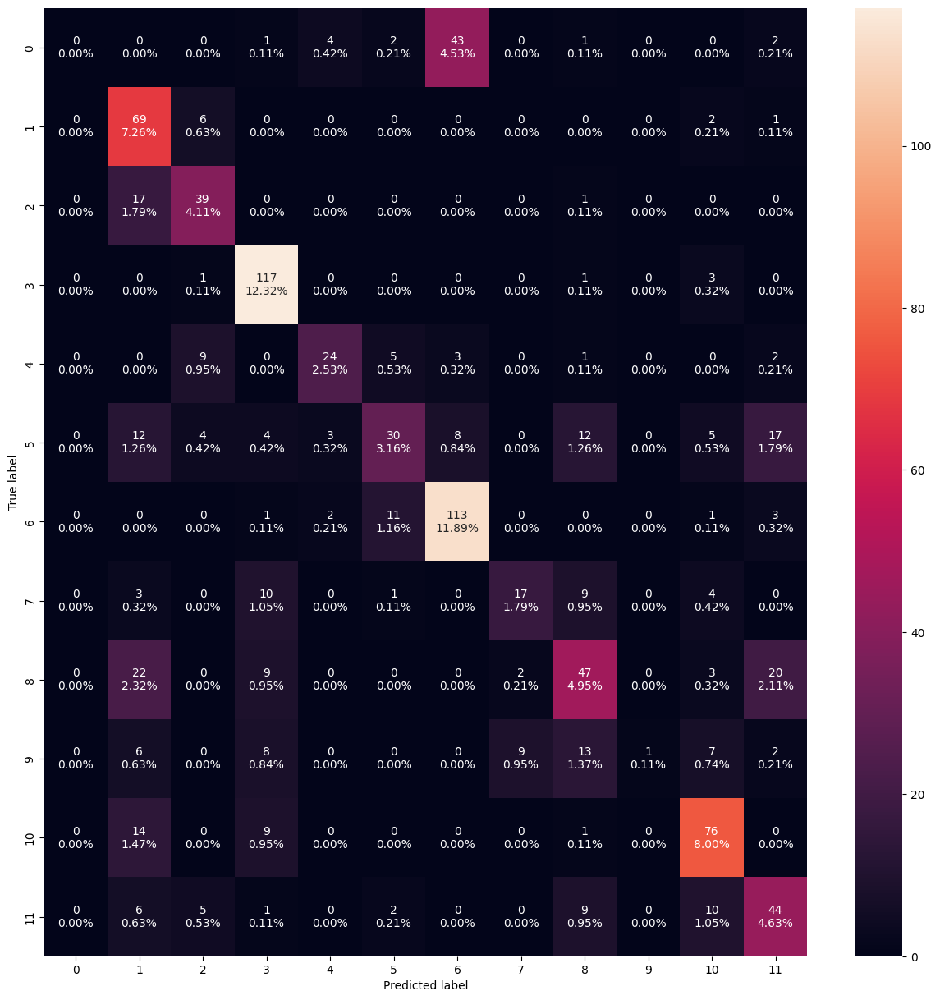

In [ ]:
confusion_matrix_sklearn(model9, X_val_normalized, y_val_encoded)

### Model 10 - Transfer Learning with VGG16

In [ ]:
tf.keras.backend.clear_session() #clears current session, resetting all layers and model, freeing up memory

In [ ]:
vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(64,64,3))
vgg_model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 64, 64, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 64, 64, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 64, 64, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 32, 32, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 16, 16, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 16, 16, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 2, 2, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

- This is the architecture for the VGG16 model.
- There are around 15 million parameters.

In [ ]:
for layer in vgg_model.layers:
  layer.trainable = False

- Freezes the weights in the VGG model.

In [ ]:
model10 = Sequential()

model10.add(vgg_model)
model10.add(Flatten())
model10.add(Dense(64, activation='relu'))
model10.add(Dropout(0.2))
model10.add(Dense(32, activation='relu'))
model10.add(Dropout(0.2))
model10.add(Dense(16, activation='relu'))
model10.add(Dense(12, activation='softmax'))

In [ ]:
model10.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 2, 2, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │         131,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,848,636 (56.64 MB)

 Trainable params: 133,948 (523.23 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
optimizer = Adam(learning_rate=0.0001)
model10.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start = time.time() #starting time
history10 = model10.fit(
    X_train_normalized,
    y_train_encoded,
    epochs=150,
    batch_size=32,
    validation_data=(X_val_normalized, y_val_encoded)
)
end = time.time() #ending time

Epoch 1/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.1062 - loss: 2.5033 - val_accuracy: 0.1505 - val_loss: 2.4209
Epoch 2/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.1315 - loss: 2.4223 - val_accuracy: 0.2211 - val_loss: 2.3813
Epoch 3/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.1550 - loss: 2.3905 - val_accuracy: 0.2453 - val_loss: 2.3298
Epoch 4/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.1953 - loss: 2.3428 - val_accuracy: 0.2463 - val_loss: 2.2821
Epoch 5/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.2027 - loss: 2.3071 - val_accuracy: 0.2495 - val_loss: 2.2365
Epoch 6/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.2328 - loss: 2.2654 - val_accuracy: 0.2621 - val_loss: 2.1952
Epoch 7/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.2345 - loss: 2.2149 - val_accuracy: 0.2684 - val_loss: 2.1493
Epoch 8/150
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.2510 - loss: 2.1894 - val_accuracy: 0

In [ ]:
print(f"Time taken in seconds: {end-start} seconds")

Time taken in seconds: 382.95289421081543 seconds


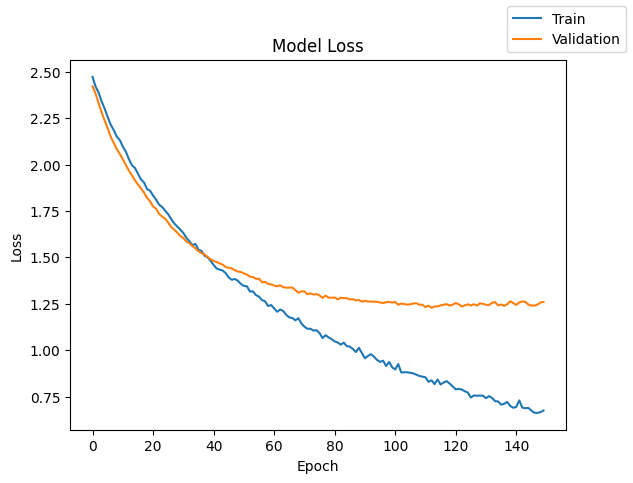

In [ ]:
plot(history10, 'loss')

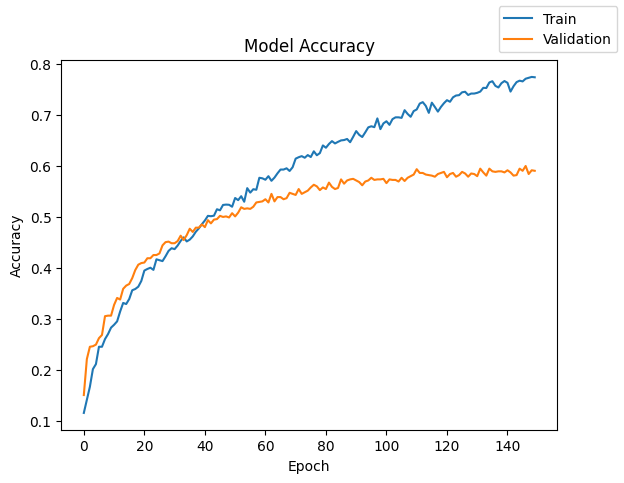

In [ ]:
plot(history10, 'accuracy')

In [ ]:
model10_train_perf = model_performance_classification(model10, X_train_normalized, y_train_encoded)
model10_train_perf

90/90 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.776842,0.776842,0.927287,0.829944


90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step


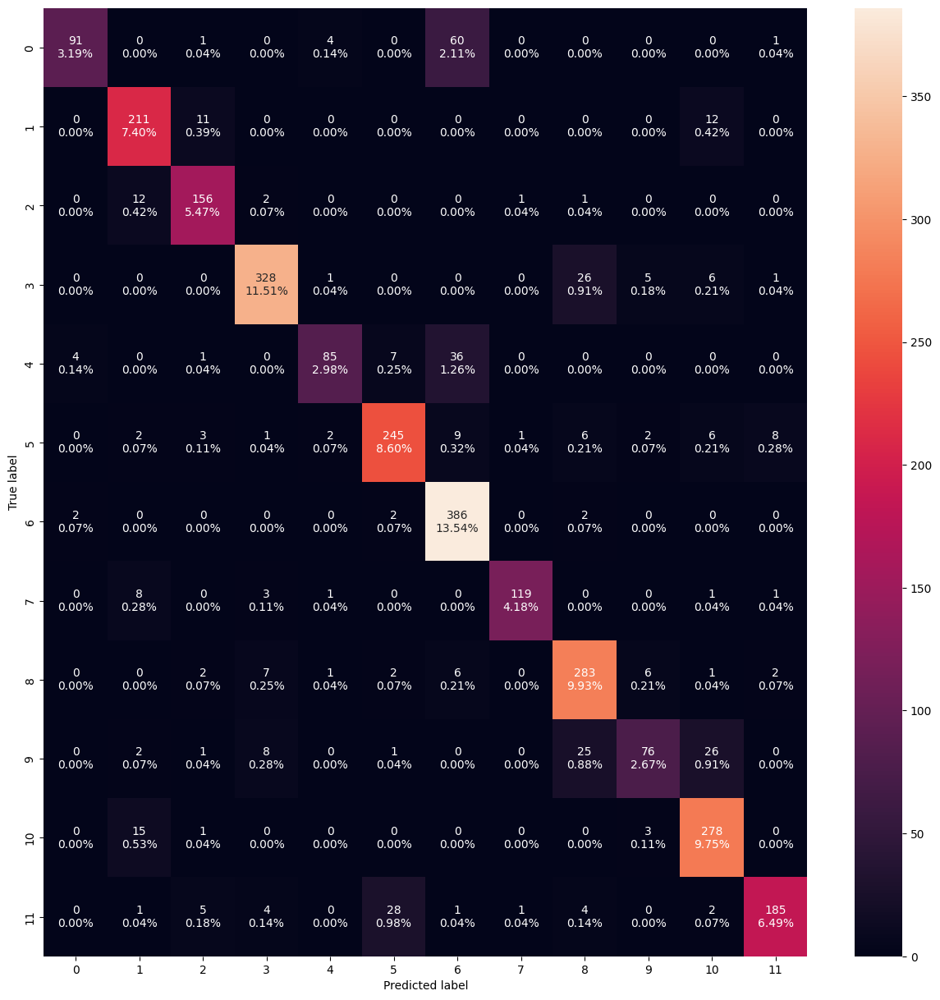

In [ ]:
confusion_matrix_sklearn(model10, X_train_normalized, y_train_encoded)

In [ ]:
model10_val_perf = model_performance_classification(model10, X_val_normalized, y_val_encoded)
model10_val_perf

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.485263,0.485263,0.645997,0.536043


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


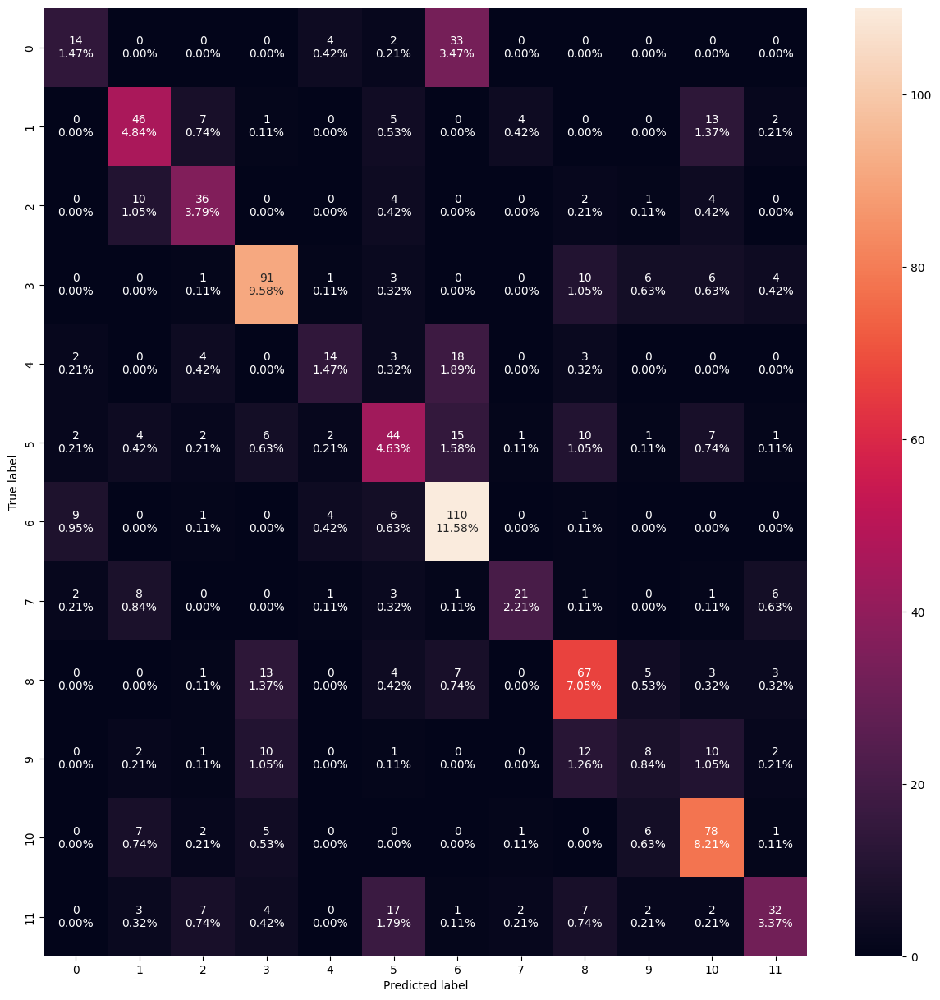

In [ ]:
confusion_matrix_sklearn(model10, X_val_normalized, y_val_encoded)

- Still overfitting.

### Model 11 - Same as model 4 but new parameters

In [ ]:
tf.keras.backend.clear_session() #clears current session, resetting all layers and model, freeing up memory

In [ ]:
model11 = Sequential()

model11.add(Conv2D(124, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model11.add(Conv2D(64, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model11.add(MaxPooling2D(pool_size=(2,2)))
model11.add(Conv2D(32, (3,3), padding='same', activation='relu'))
model11.add(MaxPooling2D(pool_size=(2,2)))
model11.add(Conv2D(8, (3,3), padding='same', activation='relu'))
model11.add(MaxPooling2D(pool_size=(2,2)))
model11.add(Flatten())
model11.add(Dense(64, activation='relu'))
model11.add(Dense(32, activation='relu'))
model11.add(Dense(16, activation='relu'))
model11.add(Dense(12, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model11.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 124)         │           3,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 64)          │          71,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 8)           │           2,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 8)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 131,380 (513.20 KB)

 Trainable params: 131,380 (513.20 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
optimizer = Adam(learning_rate=0.0001)
model11.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start = time.time() #starting time
history11 = model11.fit(
    X_train_normalized,
    y_train_encoded,
    epochs=100,
    batch_size=32,
    validation_data=(X_val_normalized, y_val_encoded)
)
end = time.time() #ending time

Epoch 1/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step - accuracy: 0.1127 - loss: 2.4773 - val_accuracy: 0.1284 - val_loss: 2.4618
Epoch 2/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.1418 - loss: 2.4529 - val_accuracy: 0.1284 - val_loss: 2.4497
Epoch 3/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.1419 - loss: 2.4376 - val_accuracy: 0.1284 - val_loss: 2.4173
Epoch 4/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.1477 - loss: 2.3873 - val_accuracy: 0.1632 - val_loss: 2.3225
Epoch 5/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.2164 - loss: 2.2679 - val_accuracy: 0.2411 - val_loss: 2.1599
Epoch 6/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.2552 - loss: 2.1186 - val_accuracy: 0.2832 - val_loss: 2.0476
Epoch 7/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.3003 - loss: 1.9912 - val_accuracy: 0.3032 - val_loss: 1.9468
Epoch 8/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.3272 - loss: 1.8858 - val_accuracy: 0

In [ ]:
print(f"Time taken in seconds: {end-start} seconds")

Time taken in seconds: 238.32811331748962 seconds


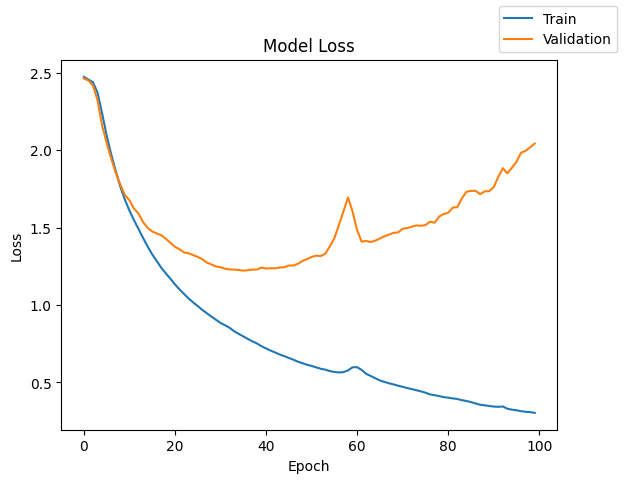

In [ ]:
plot(history11, 'loss')

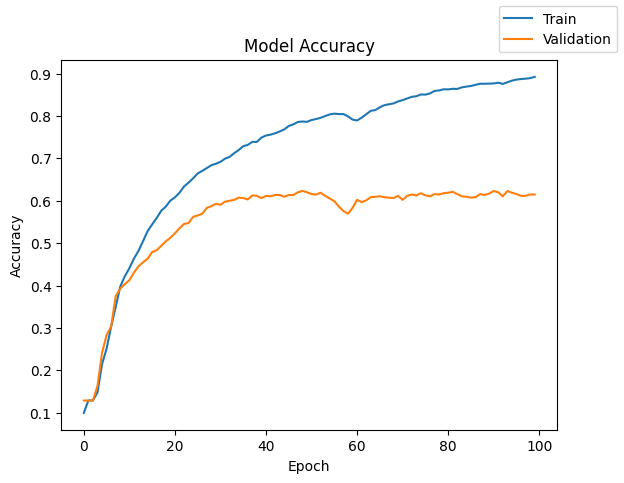

In [ ]:
plot(history11, 'accuracy')

In [ ]:
model11_train_perf = model_performance_classification(model11, X_train_normalized, y_train_encoded)
model11_train_perf

90/90 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.826316,0.826316,0.881755,0.827391


90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step


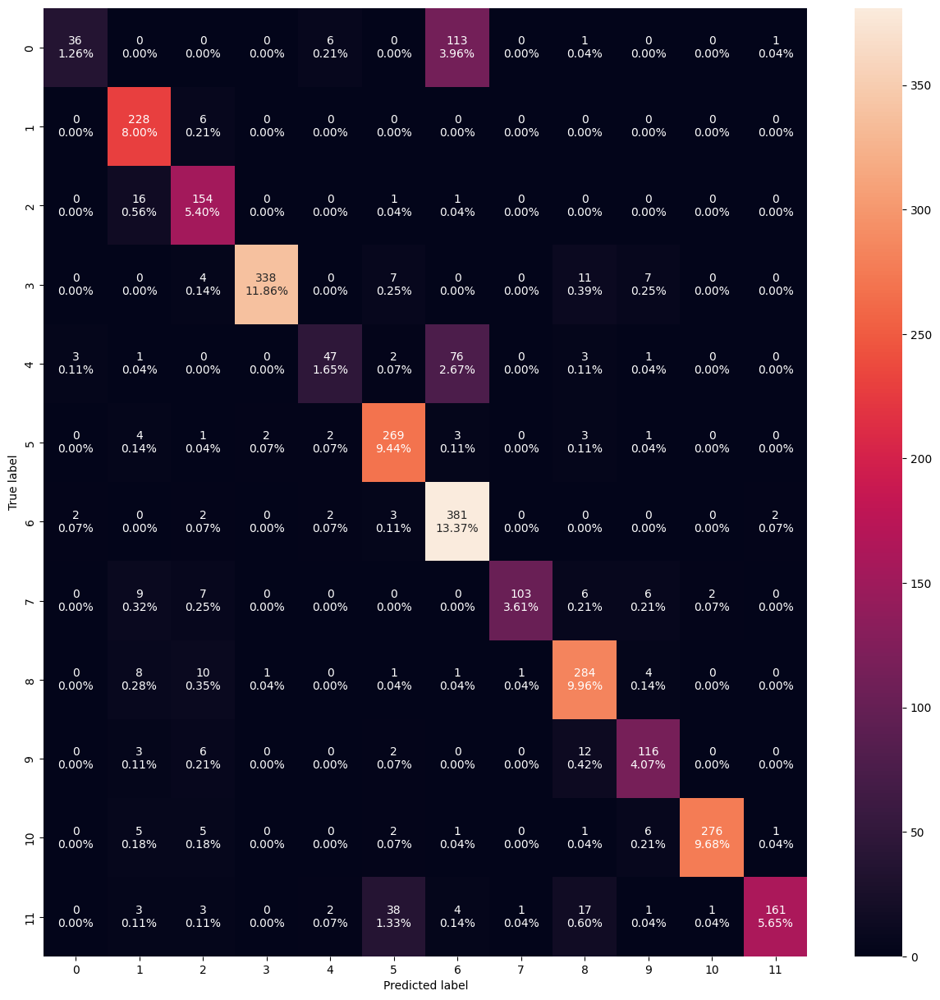

In [ ]:
confusion_matrix_sklearn(model11, X_train_normalized, y_train_encoded)

In [ ]:
model11_val_perf = model_performance_classification(model11, X_val_normalized, y_val_encoded)
model11_val_perf

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.606316,0.606316,0.639021,0.599915


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


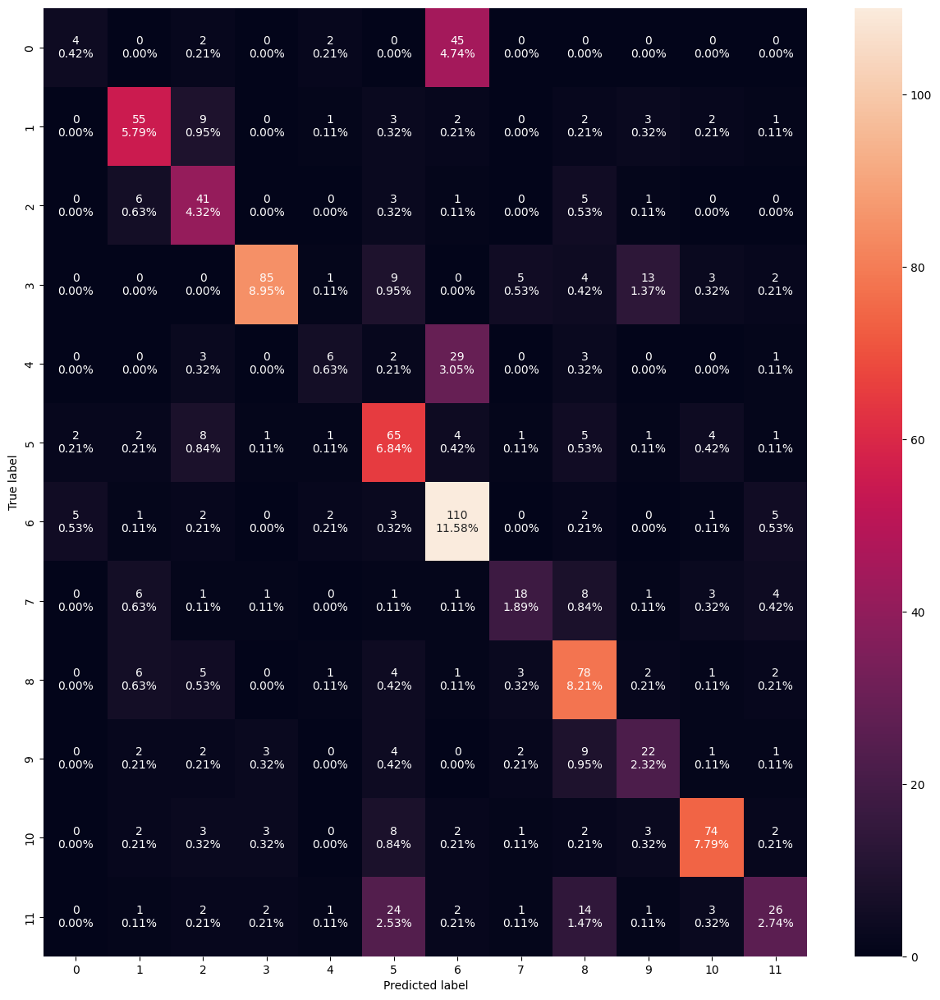

In [ ]:
confusion_matrix_sklearn(model11, X_val_normalized, y_val_encoded)

### Model 12 - Same as model 11 but new parameters

In [ ]:
tf.keras.backend.clear_session() #clears current session, resetting all layers and model, freeing up memory

In [ ]:
model12 = Sequential()

model12.add(Conv2D(124, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model12.add(Conv2D(64, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model12.add(MaxPooling2D(pool_size=(2,2)))
model12.add(Conv2D(32, (3,3), padding='same', activation='relu'))
model12.add(MaxPooling2D(pool_size=(2,2)))
model12.add(Conv2D(8, (3,3), padding='same', activation='relu'))
model12.add(MaxPooling2D(pool_size=(2,2)))
model12.add(Flatten())
model12.add(Dense(64, activation='relu', kernel_regularizer='l1'))
model12.add(Dense(32, activation='relu'))
model12.add(Dense(16, activation='relu'))
model12.add(Dense(12, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model12.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 124)         │           3,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 64)          │          71,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 8)           │           2,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 8)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 131,380 (513.20 KB)

 Trainable params: 131,380 (513.20 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
optimizer = Adam(learning_rate=0.0001)
model12.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start = time.time() #starting time
history12 = model12.fit(
    X_train_normalized,
    y_train_encoded,
    epochs=100,
    batch_size=32,
    validation_data=(X_val_normalized, y_val_encoded)
)
end = time.time() #ending time

Epoch 1/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - accuracy: 0.1046 - loss: 18.4522 - val_accuracy: 0.1105 - val_loss: 16.3551
Epoch 2/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.1148 - loss: 15.6984 - val_accuracy: 0.1063 - val_loss: 13.7946
Epoch 3/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.1116 - loss: 13.2068 - val_accuracy: 0.1074 - val_loss: 11.5022
Epoch 4/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.1343 - loss: 10.9911 - val_accuracy: 0.1600 - val_loss: 9.4648
Epoch 5/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.1557 - loss: 8.9821 - val_accuracy: 0.2558 - val_loss: 7.6347
Epoch 6/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.2607 - loss: 7.2272 - val_accuracy: 0.3305 - val_loss: 6.1685
Epoch 7/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.3573 - loss: 5.8648 - val_accuracy: 0.3463 - val_loss: 5.1203
Epoch 8/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.3834 - loss: 4.8648 - val_accu

In [ ]:
print(f"Time taken in seconds: {end-start} seconds")

Time taken in seconds: 243.28852677345276 seconds


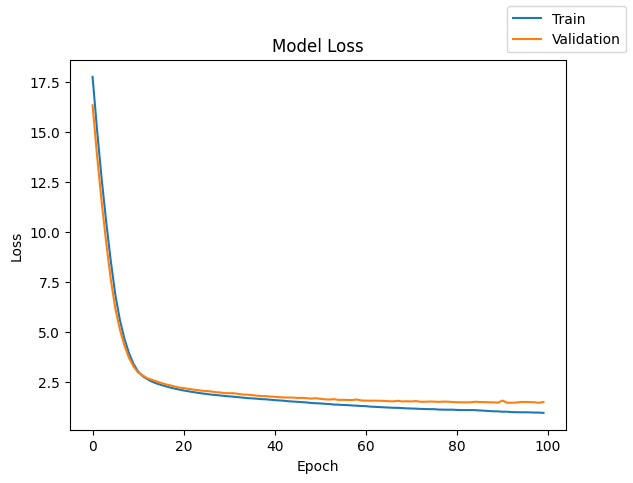

In [ ]:
plot(history12, 'loss')

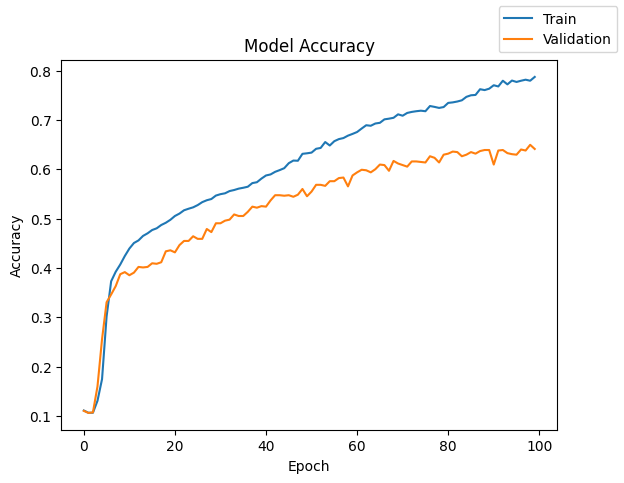

In [ ]:
plot(history12, 'accuracy')

In [ ]:
model12_train_perf = model_performance_classification(model12, X_train_normalized, y_train_encoded)
model12_train_perf

90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.721404,0.721404,0.831685,0.743005


90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


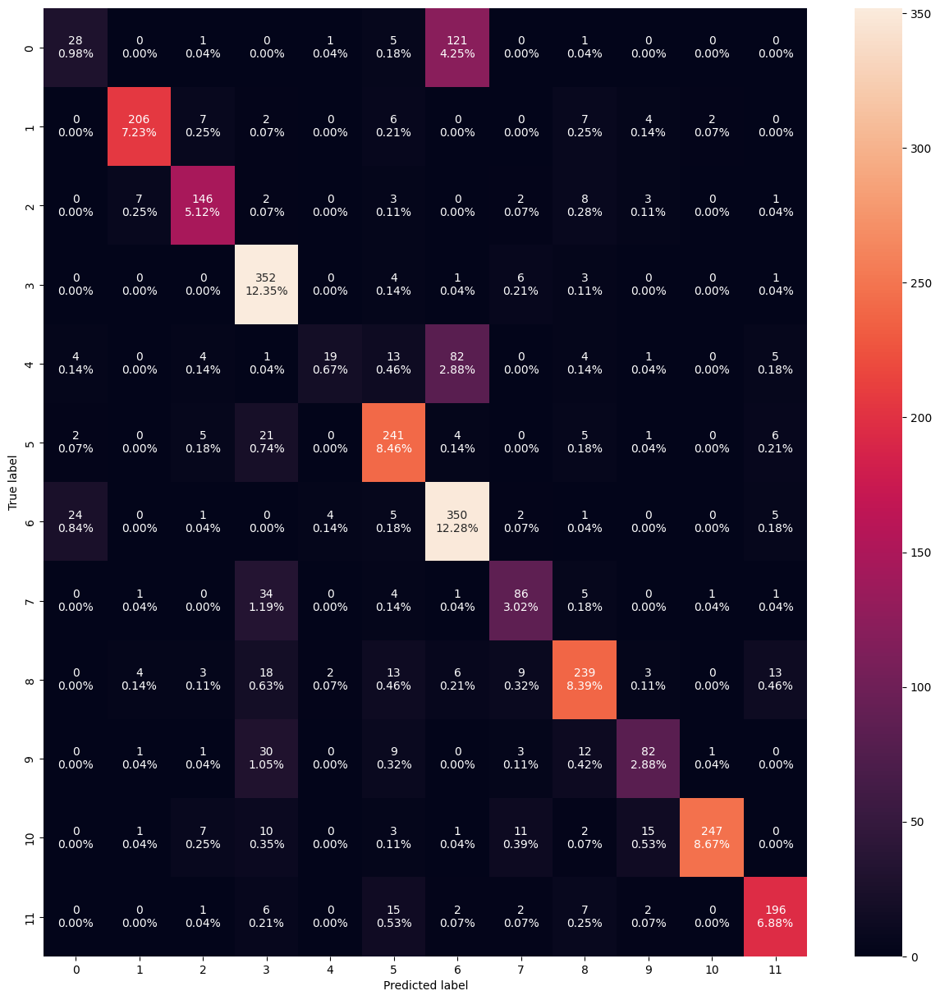

In [ ]:
confusion_matrix_sklearn(model12, X_train_normalized, y_train_encoded)

In [ ]:
model12_val_perf = model_performance_classification(model12, X_val_normalized, y_val_encoded)
model12_val_perf

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.576842,0.576842,0.665322,0.596001


30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


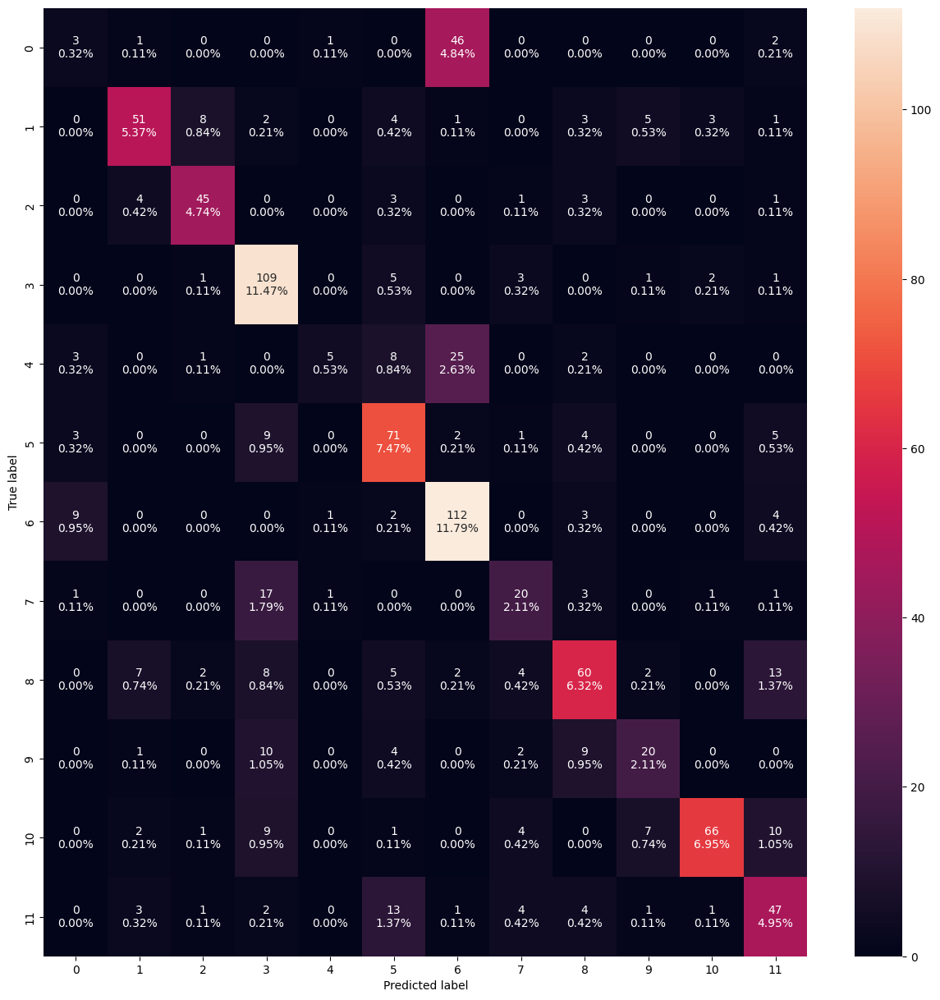

In [ ]:
confusion_matrix_sklearn(model12, X_val_normalized, y_val_encoded)

## Final Model

Comment on the final model you have selected and use the same in the below code to visualize the image.

In [ ]:
models_train_comp_df = pd.concat([
    model1_train_perf.T,
    model2_train_perf.T,
    model3_train_perf.T,
    model4_train_perf.T,
    model5_train_perf.T,
    model6_train_perf.T,
    model7_train_perf.T,
    model8_train_perf.T,
    model9_train_perf.T,
    model10_train_perf.T,
    model11_train_perf.T,
    model12_train_perf.T
], axis=1)

models_train_comp_df.columns = [
    'Model 1',
    'Model 2',
    'Model 3',
    'Model 4',
    'Model 5',
    'Model 6',
    'Model 7',
    'Model 8',
    'Model 9',
    'Model 10',
    'Model 11',
    'Model 12'
]

print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Model 1,Model 2,Model 3,Model 4,Model 5,Model 6,Model 7,Model 8,Model 9,Model 10,Model 11,Model 12
Accuracy,0.012281,1.0,0.828421,0.714386,0.692632,0.933333,0.925263,0.849825,0.394386,0.776842,0.826316,0.721404
Recall,0.012281,1.0,0.828421,0.714386,0.692632,0.933333,0.925263,0.849825,0.394386,0.776842,0.826316,0.721404
Precision,0.051213,1.0,0.908837,0.851413,0.828392,0.963491,0.957270,0.947203,0.601720,0.927287,0.881755,0.831685
F1 Score,0.019811,1.0,0.852189,0.750911,0.734966,0.938943,0.935075,0.890052,0.426906,0.829944,0.827391,0.743005


In [ ]:
models_validation_comp_df = pd.concat([
    model1_val_perf.T,
    model2_val_perf.T,
    model3_val_perf.T,
    model4_val_perf.T,
    model5_val_perf.T,
    model6_val_perf.T,
    model7_val_perf.T,
    model8_val_perf.T,
    model9_val_perf.T,
    model10_val_perf.T,
    model11_val_perf.T,
    model12_val_perf.T
], axis=1)

models_validation_comp_df.columns = [
    'Model 1',
    'Model 2',
    'Model 3',
    'Model 4',
    'Model 5',
    'Model 6',
    'Model 7',
    'Model 8',
    'Model 9',
    'Model 10',
    'Model 11',
    'Model 12'
]

print("Validation performance comparison:")
models_validation_comp_df

Validation performance comparison:


,Model 1,Model 2,Model 3,Model 4,Model 5,Model 6,Model 7,Model 8,Model 9,Model 10,Model 11,Model 12
Accuracy,0.014737,0.743158,0.656842,0.622105,0.589474,0.773684,0.711579,0.580000,0.377895,0.485263,0.606316,0.576842
Recall,0.014737,0.743158,0.656842,0.622105,0.589474,0.773684,0.711579,0.580000,0.377895,0.485263,0.606316,0.576842
Precision,0.060329,0.742175,0.708764,0.741937,0.731136,0.831058,0.758437,0.766679,0.511294,0.645997,0.639021,0.665322
F1 Score,0.023687,0.740426,0.666903,0.658046,0.635587,0.787379,0.716624,0.642094,0.410684,0.536043,0.599915,0.596001


- Model 6 and Model 7 are overfitting so they are not good models to be finalized.
- Model 8 is not a great model either.
- Model 9 is pretty good in the sense that it is just lightly overfitting, however the accuracy is really low in the 30s so it is not a really good model to finalize.
- Model 10, 11, and 12 are not good models to finalize because they are overfitting to the training data.
- Model 1 and 2 are not good models.

- I think model 4 is a good model to finalize.

In [ ]:
model4_test_perf = model_performance_classification(model4, X_test_normalized, y_test_encoded)
model4_test_perf

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.628421,0.628421,0.758746,0.659494


### Visualizing the prediction

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


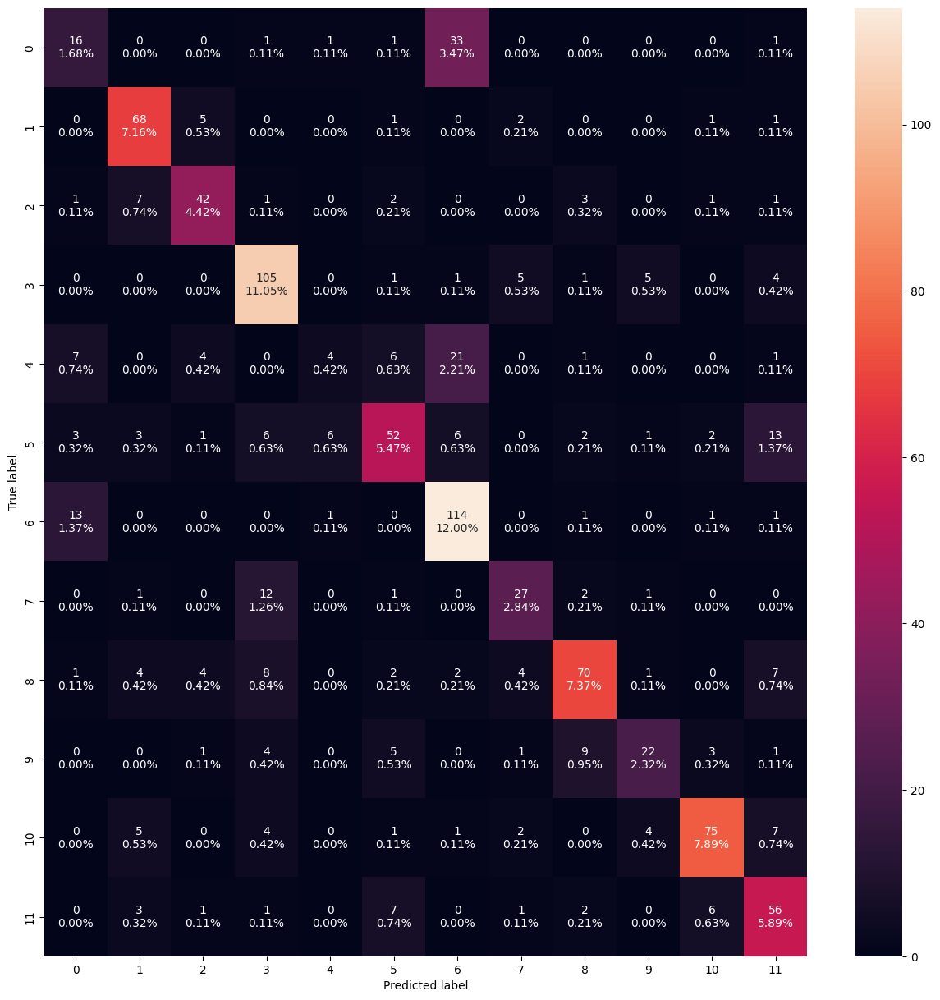

In [ ]:
confusion_matrix_sklearn(model4, X_test_normalized, y_test_encoded)

## Actionable Insights and Business Recommendations

- I think model 4 is a good model to finalize.
- Yes, there is imbalance in the dataset.
- 'Loose Silky-bent' has the most images followed by 'Common Chickweed'
- There is a huge difference on the count of the different types of seeds
- The images shape is (# of samples/images, width, height, channels)
  - So, there are 4,750 samples/images
  - Each image has a width of 128 and a height of 128
  - Each image has 3 channels
- The lables has 4,750 samples/images and it indicates the class of each image

In [ ]:
#convert to html
!jupyter nbconvert --to html /content/CV_Project_Full_Code_Notebook.ipynb

[NbConvertApp] Converting notebook /content/CV_Project_Full_Code_Notebook.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 150 image(s).
[NbConvertApp] Writing 13392754 bytes to /content/CV_Project_Full_Code_Notebook.html


_____